<a href="https://colab.research.google.com/github/escuccim/pytorch-face-autoencoder/blob/master/eas7_faces_7_gan_var.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Adding some longer residual connections to try to preserve some small details which seem to be getting lost; added batch norm; replaced 6x5 convolution with global average pool followed by 1x1 convolution.

Added a discriminator and training as a GAN (but still with autoencoder) to see if that improves the results. Also switched to variational autoencoder, with slight changes to architecture to keep model from getting too big. Training from scratch.

The variational model doesn't seem to be learning much, we are going to increase the size of the hidden space and try to re-train to see if the results improve.

The model with the larger latent space doesn't seem to be learning any better. I'm going to revert to the non-variational model which did perform very well and adapt it to be variational.

In [1]:
import torch
import torchvision
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
%matplotlib inline
import zipfile
import os

from google.colab import auth
auth.authenticate_user()

# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'pneumonia'

!gcloud config set project {project_id}

Updated property [core/project].


To take a quick anonymous survey, run:
  $ gcloud alpha survey



In [2]:
# !gsutil cp gs://{bucket_name}/gen_model_7_var_no_gan.pt ./gen_model_7_var.pt 
!gsutil cp gs://{bucket_name}/gen_model_7_var1.pt ./gen_model_7_var.pt
!gsutil cp gs://{bucket_name}/disc_model_7_var1.pt ./disc_model_7_var.pt

Copying gs://pneumonia/gen_model_7_var1.pt...
| [1 files][326.9 MiB/326.9 MiB]                                                
Operation completed over 1 objects/326.9 MiB.                                    
Copying gs://pneumonia/disc_model_7_var1.pt...
\ [1 files][ 44.6 MiB/ 44.6 MiB]                                                
Operation completed over 1 objects/44.6 MiB.                                     


In [3]:
if not os.path.exists("celeba-dataset.zip"):
#   !kaggle datasets download -d jessicali9530/celeba-dataset
  !gsutil cp gs://{bucket_name}/celeba-dataset.zip ./celeba-dataset.zip
  zip_ref = zipfile.ZipFile('celeba-dataset.zip', 'r')
  zip_ref.extractall('data')
  zip_ref.close()

  zip_ref = zipfile.ZipFile('data/img_align_celeba.zip', 'r')
  zip_ref.extractall('data/images')
  zip_ref.close()

Copying gs://pneumonia/celeba-dataset.zip...
/ [1 files][  1.2 GiB/  1.2 GiB]   69.7 MiB/s                                   
Operation completed over 1 objects/1.2 GiB.                                      


In [4]:
if not os.path.exists("Training_Pictures.zip"):
  !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
  zip_ref = zipfile.ZipFile('Training_Pictures.zip', 'r')
  zip_ref.extractall('data/images')
  zip_ref.close()

--2019-07-13 05:31:07--  https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
Resolving s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)... 52.95.156.49
Connecting to s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)|52.95.156.49|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1073596 (1.0M) [application/zip]
Saving to: ‘Training_Pictures.zip’

Training_Pictures.z 100%[===================>]   1.02M  1.99MB/s    in 0.5s    

2019-07-13 05:31:08 (1.99 MB/s) - ‘Training_Pictures.zip’ saved [1073596/1073596]



In [5]:
# if not os.path.exists("imdb_images3.zip"):  
#   !gsutil cp gs://{bucket_name}/imdb_images3.zip ./imdb_images3.zip
#   zip_ref = zipfile.ZipFile('imdb_images3.zip', 'r')
#   zip_ref.extractall('data/images')
#   zip_ref.close()

if not os.path.exists("crop_part1.tar.gz"):
  !gsutil cp gs://{bucket_name}/crop_part1.tar.gz ./crop_part1.tar.gz
  !tar -xf crop_part1.tar.gz -C data/images

Copying gs://pneumonia/crop_part1.tar.gz...
| [1 files][ 43.3 MiB/ 43.3 MiB]                                                
Operation completed over 1 objects/43.3 MiB.                                     


In [4]:
# get test data
# if not os.path.exists("faces94.zip"):
#   !wget https://cswww.essex.ac.uk/mv/allfaces/faces94.zip
#   zip_ref = zipfile.ZipFile('faces94.zip', 'r')
#   zip_ref.extractall('data/test_images')
#   zip_ref.close()
  
# if not os.path.exists("faces96.zip"):
#   !wget https://cswww.essex.ac.uk/mv/allfaces/faces96.zip  
#   zip_ref = zipfile.ZipFile('faces96.zip', 'r')
#   zip_ref.extractall('data/test_images')
#   zip_ref.close()

if not os.path.exists("wiki_images2.zip"):
  !gsutil cp gs://{bucket_name}/wiki_images2.zip ./wiki_images.zip
  zip_ref = zipfile.ZipFile('wiki_images.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()

if not os.path.exists("faces95.zip"):
  !wget https://cswww.essex.ac.uk/mv/allfaces/faces95.zip  
  zip_ref = zipfile.ZipFile('faces95.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()

if not os.path.exists("GWB_200x200_JPEG.zip"):
  !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/GWB_200x200_JPEG.zip
  zip_ref = zipfile.ZipFile('GWB_200x200_JPEG.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()    

Copying gs://pneumonia/wiki_images2.zip...
/ [1 files][160.5 MiB/160.5 MiB]                                                
Operation completed over 1 objects/160.5 MiB.                                    
--2019-07-14 05:34:58--  https://cswww.essex.ac.uk/mv/allfaces/faces95.zip
Resolving cswww.essex.ac.uk (cswww.essex.ac.uk)... 155.245.92.179
Connecting to cswww.essex.ac.uk (cswww.essex.ac.uk)|155.245.92.179|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6425534 (6.1M) [application/zip]
Saving to: ‘faces95.zip’

faces95.zip         100%[===================>]   6.13M  5.53MB/s    in 1.1s    

2019-07-14 05:35:00 (5.53 MB/s) - ‘faces95.zip’ saved [6425534/6425534]

--2019-07-14 05:35:02--  https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/GWB_200x200_JPEG.zip
Resolving s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)... 52.95.154.13
Connecting to s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)|52.95.154.13|:443... connected.
HTTP request sent, aw

In [0]:
BATCH_SIZE = 10
data_path = "data/images"

transform = torchvision.transforms.Compose(
    [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
      torchvision.transforms.RandomApply([
        torchvision.transforms.RandomAffine(degrees=7, translate=(0.05,0.05), scale=(0.9,1.1), shear=3, resample=False, fillcolor=0),        
      ], 0.6),
      torchvision.transforms.RandomResizedCrop((192,160), scale=(0.8, 1.20)),
      torchvision.transforms.ToTensor(),
    ])

transform2 = torchvision.transforms.Compose(
    [torchvision.transforms.RandomResizedCrop((192,160), scale=(0.95, 1.05)),
      torchvision.transforms.ToTensor(),
    ])

train_dataset = torchvision.datasets.ImageFolder(
        root=data_path,
        transform=transform
    )

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=2,
    shuffle=True
)

test_dataset = torchvision.datasets.ImageFolder(
        root="data/test_images",
        transform=transform2
    )

test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=32,
    num_workers=1,
    shuffle=True
)

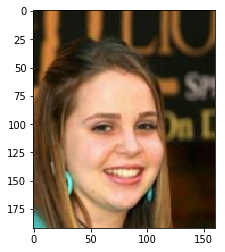

In [6]:
for (images, _) in train_loader:
  plt.imshow(images[0].permute(1,2,0))
  plt.show()
  break

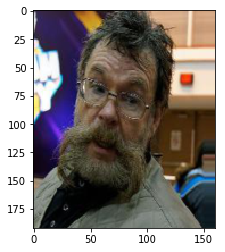

In [7]:
for (images, _) in test_loader:
  plt.imshow(images[0].permute(1,2,0))
  plt.show()
  break

In [8]:
train_dataset

Dataset ImageFolder
    Number of datapoints: 212421
    Root location: data/images

In [10]:
test_dataset

Dataset ImageFolder
    Number of datapoints: 17629
    Root location: data/test_images

In [0]:
def output_size(i, k=3, p=2, s=1, d=1):
    o = (i + 2*p - k - (k-1)*(d-1))/s + 1
    return o
  
output_size(i=64, k=3, p=1)

### Bigger Model

In [0]:
epoch_list = [0]

In [0]:
def vae_loss(x, x_hat, mu=None, logvar=None, d_faked=None, debug=False):
    beta_mse = 32.0
    beta_kld = 2.0
    beta_gloss = 1.0 #0.5
    
    total_loss = 0
    # MSE for reconstructions
    MSE = nn.functional.mse_loss(x, x_hat)
    
    # weight the MSE loss higher so the discriminator loss doesn't overwhelm it
    if d_faked is not None:
        ones = torch.ones(d_faked.shape[0]).cuda()
        g_loss =  nn.functional.binary_cross_entropy_with_logits(d_faked, ones, reduction="mean")
    else:
        g_loss = torch.zeros(1)
    
    total_loss = (MSE * beta_mse) + (g_loss * beta_gloss)
    
    # variational loss IF we are doing variational
    if mu is not None and logvar is not None:
        KLD = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp()) 
        total_loss += (KLD * beta_kld)
    else:
        KLD = torch.zeros(1)
        
    # print out loss info if we want to debug
    if debug:
        print("MSE Loss Raw:", MSE)
        print("MSE Loss Weighted:", MSE * beta_mse)
        print("KLD Loss Raw:", KLD)
        print("KLD Loss Weighted:", KLD * beta_kld)
        if d_faked is not None:
            print("Disc Loss Raw:", g_loss)
            print("Disc Loss Weighted:", g_loss * beta_gloss)
        print("Total Loss (weighted):", total_loss)
    
    return total_loss, MSE * beta_mse, KLD * beta_kld, g_loss * beta_gloss
  
def disc_loss(d_true, d_faked):
    ones = torch.ones(d_true.shape[0]).cuda()
    zeros = torch.zeros(d_faked.shape[0]).cuda()
    d_loss_real = nn.functional.binary_cross_entropy_with_logits(d_true, ones, reduction="mean")
    d_loss_fake = nn.functional.binary_cross_entropy_with_logits(d_faked, zeros, reduction="mean")
    d_loss = d_loss_real + d_loss_fake

    return d_loss

def disc_loss2(labels, logits):
    d_loss = nn.functional.binary_cross_entropy_with_logits(logits, labels, reduction="mean")
    
    return d_loss    


def train_discriminator2(discriminator, generator, train_loader, d_optimizer, g_optimizer, train_gen=True, train_disc=True, test_loader=None, print_metrics=1000, extra_gen_train=2, plot_images=4000, num_epochs=10, display_images=5, g_scheduler=None, d_scheduler=None, d_save_path="disc_model_3.pt", g_save_path="gen_model_3.pt"):
    
    # if we aren't training the generator we don't need to train the discriminator less than every epoch
    if train_gen is False:
      extra_gen_train = 1
      
    try:
      for epoch in range(num_epochs):
          discriminator.train()
          generator.train()
          d_upload_path = d_save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 
          g_upload_path = g_save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 
          
          mse_loss = 0
          kld_loss = 0
          disc_losses = 0
          
          d_tr_loss = 0.0
          g_tr_loss = 0.0
          d_test_loss = 0.0
          g_test_loss = 0.0
          test_loss = 0.0
          test_d_loss = 0
          
          test_d_acc = []
          batch_losses = []
          batch_accuracies = []
          
          for i, (inputs, _) in enumerate(train_loader):
              if inputs.shape[0] == 1:
                continue
                
              if use_cuda and torch.cuda.is_available():
                  inputs = inputs.cuda()

              d_optimizer.zero_grad()
              g_optimizer.zero_grad()
              
              # generate our fake images
              if train_gen:
                  recon, code, logvar = generator(inputs)
              else:
                with torch.no_grad():
                    recon, code, logvar = generator(inputs)
              
              # concat half of the real images and half of the recons for the discriminator batch
              # it should be different halves
              batch_size = inputs.shape[0] // 2
              disc_batch = torch.cat((inputs[:batch_size], recon[batch_size:]), 0)
              
              # feed the batch to the discriminator
              d_logits = discriminator(disc_batch)
              
              if use_cuda:
                  ones = torch.ones(batch_size).cuda()
                  zeros = torch.zeros(batch_size).cuda()
              else:
                  ones = torch.ones(batch_size)
                  zeros = torch.zeros(batch_size)

              labels = torch.cat((ones, zeros))
              d_loss = disc_loss2(labels, d_logits)
              
              # calculate the accuracy of our discriminator
              d_preds = torch.sigmoid(d_logits).round()
              
              d_accuracy = torch.mean((d_preds == labels).double())
              batch_accuracies.append(d_accuracy.item())
              
              # update the discriminator every other step to give the generator time to catch up
              if train_disc and (np.mean(batch_accuracies) <= 0.80 or d_accuracy.item() <= 0.75):
                d_loss.backward(retain_graph=True)
                d_optimizer.step()
                d_optimizer.zero_grad()
              
              # feed the reconstructed images into the discriminator for the generator loss
              faked_logits = discriminator(recon)
                
              # update the generator, use no grad if we aren't training the generator to speed things up and save RAM
              if train_gen:
                g_loss, mse, kld, disc_loss = vae_loss(inputs, recon, code, logvar=logvar, d_faked=faked_logits)
                g_loss.backward()
                g_optimizer.step()
              else:
                with torch.no_grad():
                  g_loss, mse, kld, disc_loss = vae_loss(inputs, recon, code, logvar=logvar, d_faked=faked_logits)
              
              g_tr_loss += g_loss.item()
              mse_loss += mse.item()
              kld_loss += kld.item()
              disc_losses += disc_loss.item()
              
              d_tr_loss += d_loss.item()
              batch_losses.append(g_loss.item())
            
              if i > 0 and print_metrics != 0 and i % print_metrics == 0:
                print("\tEpoch", len(epoch_list), "batch", i, "gen total loss:", g_loss.item(), "mse loss:", mse.item(), "kld loss:", kld.item(), "xe loss:", disc_loss.item(), "disc loss:", d_loss.item(), "disc acc:", np.mean(batch_accuracies))

              if i % plot_images == 0 and i > 0:
                fig, ax = plt.subplots(1, 2, figsize=(6,6))
                ax[0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                plt.show()
          
          if epoch % display_images == 0:
              # plot a few random images
              try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Training Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
              except Exception as e:
                  print(e)

              torch.save(discriminator.state_dict(), d_save_path)
              torch.save(generator.state_dict(), g_save_path)
          
          if test_loader is not None:
            generator.eval()
            discriminator.eval()
            with torch.no_grad():
              for i, (inputs, _) in enumerate(test_loader):
                if use_cuda and torch.cuda.is_available():
                  inputs = inputs.cuda()
                
                # autoencode the input images
                recon, code, logvar = generator(inputs)

                loss, _, _, _ = vae_loss(inputs, recon, code, logvar=logvar)
                test_loss += loss.item()
                
                # combine the real and recon images into a single batch for the discriminator
                disc_batch = torch.cat((inputs, recon), 0)

                # feed the batch to the discriminator
                d_logits = discriminator(disc_batch)
                
                # create labels for the disc loss function
                batch_size = d_logits.shape[0] // 2
                if use_cuda:
                    ones = torch.ones(batch_size).cuda()
                    zeros = torch.zeros(batch_size).cuda()
                else:
                    ones = torch.ones(batch_size)
                    zeros = torch.zeros(batch_size)

                labels = torch.cat((ones, zeros))
                
                # run the discriminator loss function
                d_loss = disc_loss2(labels, d_logits)
                test_d_loss += d_loss.item()
                
                # calculate the accuracy of our discriminator
                d_preds = torch.sigmoid(d_logits).round()
                d_accuracy = torch.mean((d_preds == labels).double())
                test_d_acc.append(d_accuracy.item())
                
            try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Test Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
            except Exception as e:
                print(e)
                  
          print("Epoch:", len(epoch_list), "Gen Train Loss:", g_tr_loss, "MSE Loss:", mse_loss, "KLD Loss:", kld_loss, "GAN XE Loss:", disc_losses,"Disc Train Loss:", d_tr_loss, "Test Loss:", test_loss, "Avg Tr Disc Acc:", np.mean(batch_accuracies), "Avg Te Disc Acc:", np.mean(test_d_acc))
          
          epoch_list.append(epoch)
          
          if g_scheduler is not None and epoch % 5 == 0 and epoch > 1:
              g_scheduler.step()
              
          if d_scheduler is not None and epoch % 5 == 0 and epoch > 1:
              d_scheduler.step()
 
    except KeyboardInterrupt:
      print("Interrupting... Saving model...")
      torch.save(generator.state_dict(), g_save_path)
      torch.save(discriminator.state_dict(), d_save_path)
      !gsutil cp {g_save_path} gs://{bucket_name}/{g_upload_path}
      !gsutil cp {d_save_path} gs://{bucket_name}/{d_upload_path}
      return 
    except ValueError as e:
      print("Value error... Saving model...")
      print(e)
      torch.save(generator.state_dict(), g_save_path)
      torch.save(discriminator.state_dict(), d_save_path)
      !gsutil cp {g_save_path} gs://{bucket_name}/{g_upload_path}
      !gsutil cp {d_save_path} gs://{bucket_name}/{d_upload_path}
      return 
    
    !gsutil cp {g_save_path} gs://{bucket_name}/{g_upload_path}
    !gsutil cp {d_save_path} gs://{bucket_name}/{d_upload_path}
      
# try to train so that we aren't using the real and fake versions of the same images for each batch 
# maybe that will improve the discriminator?
def train_discriminator(discriminator, generator, train_loader, d_optimizer, g_optimizer, train_gen=True, train_disc=True, test_loader=None, print_metrics=1000, extra_gen_train=2, plot_images=4000, num_epochs=10, display_images=5, g_scheduler=None, d_scheduler=None, d_save_path="disc_model_7.pt", g_save_path="gen_model_7_var.pt"):
    
    # if we aren't training the generator we don't need to train the discriminator less than every epoch
    if train_gen is False:
        extra_gen_train = 1
      
    try:
        for epoch in range(num_epochs):
            discriminator.train()
            generator.train()
            
            # generate unique names for the model based on the epoch so we have backups
            d_upload_path = d_save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 
            g_upload_path = g_save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 

            # initialize our metrics
            mse_loss = 0
            kld_loss = 0
            disc_losses = 0

            d_tr_loss = 0.0
            g_tr_loss = 0.0
            d_test_loss = 0.0
            g_test_loss = 0.0
            test_loss = 0.0
            test_d_loss = 0

            test_d_acc = []
            batch_losses = []
            batch_accuracies = []
            
            # loop through the data loader
            for i, (inputs, _) in enumerate(train_loader):
                if inputs.shape[0] <= 2:
                    continue
                    
                # if we are using CUDA copy the inputs to it
                if use_cuda and torch.cuda.is_available():
                    inputs = inputs.cuda()

                # zero out the gradients
                d_optimizer.zero_grad()
                g_optimizer.zero_grad()
               
                # generate our reconstructed images
                if train_gen:
                    recon, code, logvar = generator(inputs)
                else:
                    with torch.no_grad():
                        recon, code, logvar = generator(inputs)
                
                # if we are in an even iteration we only train the generator
                # so we use ones as the label
                if i % 2 == 0:
                    # copy them to the CPU to save RAM
                    disc_batch = inputs.clone().cpu()
                    
                    # feed the batch to the discriminator
                    faked_logits = discriminator(inputs)
                
                # if we are in an odd iteration we train both the discriminator
                # and the generator so we use the true labels
                else:
                    # concat the previous disc batch with the reconstructed images
                    input_shape = disc_batch.shape[0]
                    disc_batch = torch.cat((disc_batch.cuda(), recon), 0)
                    
                    # feed the batch to the discriminator
                    d_logits = discriminator(disc_batch)
                    
                    # separate the fake logits back out so we can feed them to the gen loss function
                    faked_logits = d_logits[recon.shape[0]:]
                    
                    batch_size = recon.shape[0]
                    if use_cuda:
                        ones = torch.ones(input_shape).cuda()
                        zeros = torch.zeros(batch_size).cuda()
                    else:
                        ones = torch.ones(input_shape)
                        zeros = torch.zeros(batch_size)
                    labels = torch.cat((ones, zeros))
                    
                    d_logits = discriminator(disc_batch)
                    d_loss = disc_loss2(labels, d_logits)
                    d_tr_loss += d_loss.item()
                    
                    # calculate the accuracy of our discriminator
                    d_preds = torch.sigmoid(d_logits).round()

                    d_accuracy = torch.mean((d_preds == labels).float())
                    batch_accuracies.append(d_accuracy.item())
                    
                    # update the discriminator every other step to give the generator time to catch up
                    if train_disc and (np.mean(batch_accuracies) <= 0.85 or d_accuracy.item() <= 0.75):
                        d_loss.backward(retain_graph=True)
                        d_optimizer.step()

                # update the generator, use no grad if we aren't training the generator to speed things up and save RAM
                if train_gen:
                    g_loss, mse, kld, disc_loss = vae_loss(inputs, recon, code, logvar=logvar, d_faked=faked_logits)
                    g_loss.backward()
                    g_optimizer.step()
                else:
                    with torch.no_grad():
                        g_loss, mse, kld, disc_loss = vae_loss(inputs, recon, code, logvar=logvar, d_faked=faked_logits)

                g_tr_loss += g_loss.item()
                mse_loss += mse.item()
                kld_loss += kld.item()
                disc_losses += disc_loss.item()

                batch_losses.append(g_loss.item())
            
                if i > 0 and print_metrics != 0 and i % print_metrics == 0:
                    print("\tEpoch", len(epoch_list), "batch", i, "gen total loss:", g_loss.item(), "mse loss:", mse.item(), "kld loss:", kld.item(), "xe loss:", disc_loss.item(), "disc loss:", d_loss.item(), "disc acc:", np.mean(batch_accuracies))

                if i % plot_images == 0 and i > 0:
                    fig, ax = plt.subplots(1, 2, figsize=(6,6))
                    ax[0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                    ax[1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                    plt.show()
          
            if epoch % display_images == 0:
                # plot a few random images
                try:
                    fig, ax = plt.subplots(2, 2, figsize=(6,6))
                    fig.suptitle("Training Images")
                    ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                    ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                    ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                    ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                    plt.show()
                except Exception as e:
                    print(e)

                torch.save(discriminator.state_dict(), d_save_path)
                torch.save(generator.state_dict(), g_save_path)

            if test_loader is not None:
                generator.eval()
                discriminator.eval()
                with torch.no_grad():
                    for i, (inputs, _) in enumerate(test_loader):
                        if use_cuda and torch.cuda.is_available():
                            inputs = inputs.cuda()

                        # autoencode the input images
                        recon, code, logvar = generator(inputs)

                        loss, _, _, _ = vae_loss(inputs, recon, code, logvar=logvar)
                        test_loss += loss.item()

                        # combine the real and recon images into a single batch for the discriminator
                        disc_batch = torch.cat((inputs, recon), 0)

                        # feed the batch to the discriminator
                        d_logits = discriminator(disc_batch)

                        # create labels for the disc loss function
                        batch_size = d_logits.shape[0] // 2
                        if use_cuda:
                            ones = torch.ones(batch_size).cuda()
                            zeros = torch.zeros(batch_size).cuda()
                        else:
                            ones = torch.ones(batch_size)
                            zeros = torch.zeros(batch_size)

                        labels = torch.cat((ones, zeros))

                        # run the discriminator loss function
                        d_loss = disc_loss2(labels, d_logits)
                        test_d_loss += d_loss.item()

                        # calculate the accuracy of our discriminator
                        d_preds = torch.sigmoid(d_logits).round()
                        d_accuracy = torch.mean((d_preds == labels).double())
                        test_d_acc.append(d_accuracy.item())

                try:
                    fig, ax = plt.subplots(2, 2, figsize=(6,6))
                    fig.suptitle("Test Images")
                    ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                    ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                    ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                    ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                    plt.show()
                except Exception as e:
                    print(e)
                  
            print("Epoch:", len(epoch_list), "Gen Train Loss:", g_tr_loss, "MSE Loss:", mse_loss, "KLD Loss:", kld_loss, "GAN XE Loss:", disc_losses,"Disc Train Loss:", d_tr_loss, "Test Loss:", test_loss, "Avg Tr Disc Acc:", np.mean(batch_accuracies), "Avg Te Disc Acc:", np.mean(test_d_acc))

            epoch_list.append(epoch)

            if g_scheduler is not None and epoch % 5 == 0 and epoch > 1:
                g_scheduler.step()

            if d_scheduler is not None and epoch % 5 == 0 and epoch > 1:
                d_scheduler.step()
 
    except KeyboardInterrupt:
        print("Interrupting... Saving model...")
        torch.save(generator.state_dict(), g_save_path)
        torch.save(discriminator.state_dict(), d_save_path)
        !gsutil cp {g_save_path} gs://{bucket_name}/{g_upload_path}
        !gsutil cp {d_save_path} gs://{bucket_name}/{d_upload_path}
        return 
    except ValueError:
        print("Value error occurred!")
        torch.save(generator.state_dict(), g_save_path)
        torch.save(discriminator.state_dict(), d_save_path)
        !gsutil cp {g_save_path} gs://{bucket_name}/{g_upload_path}
        !gsutil cp {d_save_path} gs://{bucket_name}/{d_upload_path}
        return 

    !gsutil cp {g_save_path} gs://{bucket_name}/{g_upload_path}
    !gsutil cp {d_save_path} gs://{bucket_name}/{d_upload_path}
      
def train(model, train_loader, optimizer, test_loader=None, print_metrics=1000, plot_images=4000, num_epochs=10, display_images=5, scheduler=None, save_path="model_7.pt"):
    try:
      for epoch in range(num_epochs):
          model.train()
          upload_path = save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 
          
          tr_loss = 0.0
          test_loss = 0
          batch_losses = []
          for i, (inputs, _) in enumerate(train_loader):
              if use_cuda and torch.cuda.is_available():
                  inputs = inputs.cuda()

              optimizer.zero_grad()

              recon, code, logvar = model(inputs)
              if model.variational:
                  loss = vae_loss(inputs, recon, code, logvar=logvar)
              else:  
                  loss = vae_loss(inputs, recon, code, logvar=None)

              loss.backward()
              optimizer.step()

              tr_loss += loss.item()
              batch_losses.append(loss.item())
            
              if i > 0 and print_metrics != 0 and i % print_metrics == 0:
                print("\tEpoch", len(epoch_list), "batch", i, "loss:", loss.item())

              if i % plot_images == 0 and i > 0:
                fig, ax = plt.subplots(1, 2, figsize=(6,6))
                ax[0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                plt.show()
          
          if epoch % display_images == 0:
              # plot a few random images
              try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Training Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
              except Exception as e:
                  print(e)

              torch.save(model.state_dict(), save_path)
#               !gsutil cp ./model.pt gs://{bucket_name}/
          
          if test_loader is not None:
            model.eval()
            with torch.no_grad():
              for i, (inputs, _) in enumerate(test_loader):
                if use_cuda and torch.cuda.is_available():
                    inputs = inputs.cuda()

                recon, code, logvar = model(inputs)

                if model.variational:
                    loss = vae_loss(inputs, recon, code, logvar=logvar)
                else:  
                    loss = vae_loss(inputs, recon, code, logvar=None)

                test_loss += loss.item()

            try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Test Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
            except Exception as e:
                print(e)
                  
          print("Epoch:", len(epoch_list), "Train Loss:", tr_loss, "Test Loss:", test_loss)
          
          epoch_list.append(epoch)
          
          if scheduler is not None and epoch % 5 == 0 and epoch > 1:
              scheduler.step()

                
    except KeyboardInterrupt:
        print("Interrupting... Saving model...")
        torch.save(model.state_dict(), save_path)
        !gsutil cp {save_path} gs://{bucket_name}/{upload_path}
        return 
    
    !gsutil cp {save_path} gs://{bucket_name}/{upload_path}

def count_params(model):
    model_parameters = filter(lambda p: p.requires_grad, model.parameters())
    params = sum([np.prod(p.size()) for p in model_parameters])
    return params               

In [0]:
from torch import nn
class Encoder(nn.Module):
    def __init__(self, latent_dim, variational=False):
        super(Encoder, self).__init__()
        # block 1
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)        
        self.bn2 = nn.BatchNorm2d(32)
        self.conv3 = nn.Conv2d(32, 32, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(32)
        self.downsize1 = nn.Conv2d(96, 32, 1)
        self.bn_ds1 = nn.BatchNorm2d(32)
        
        # block 2
        self.conv4 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn4 = nn.BatchNorm2d(64)
        self.conv5 = nn.Conv2d(64, 64, 3, padding=1)
        self.bn5 = nn.BatchNorm2d(64)
        self.conv6 = nn.Conv2d(64, 64, 3, padding=1)
        self.bn6 = nn.BatchNorm2d(64)
        self.downsize2 = nn.Conv2d(192, 64, 1)
        self.bn_ds2 = nn.BatchNorm2d(64)
        
        # block 3
        self.conv7 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn7 = nn.BatchNorm2d(128)
        self.conv8 = nn.Conv2d(128, 128, 3, padding=1)
        self.bn8 = nn.BatchNorm2d(128)
        self.conv9 = nn.Conv2d(128, 128, 3, padding=1)
        self.bn9 = nn.BatchNorm2d(128)
        self.downsize3 = nn.Conv2d(384, 128, 1)
        self.bn_ds3 = nn.BatchNorm2d(128)
        
        # block 4
        self.conv10 = nn.Conv2d(128, 256, 3, padding=1)
        self.bn10 = nn.BatchNorm2d(256)
        self.conv11 = nn.Conv2d(256, 256, 3, padding=1)
        self.bn11 = nn.BatchNorm2d(256)
        self.downsize4 = nn.Conv2d(512, 256, 1)
        self.bn_ds4 = nn.BatchNorm2d(256)
        
        # block 5
        self.conv12 = nn.Conv2d(256, 384, 3, padding=1)
        self.bn12 = nn.BatchNorm2d(384)
        self.conv13 = nn.Conv2d(384, 384, 3, padding=1)
        self.bn13 = nn.BatchNorm2d(384)
        self.downsize5 = nn.Conv2d(768, 384, 1)
        self.bn_ds5 = nn.BatchNorm2d(384)
        
        # second path - skip from block 2 on
        self.conv14 = nn.Conv2d(64, 128, 3, padding=1, stride=2)
        self.bn14 = nn.BatchNorm2d(128)
        self.conv15 = nn.Conv2d(128, 128, 3, padding=1, stride=2)
        self.bn15 = nn.BatchNorm2d(128)
        
        self.fc1 = nn.Conv2d(512, latent_dim, 2) # code layer
        
        self.variational = variational
        if variational:
            self.fc2 = nn.Conv2d(512, latent_dim, 2) # variance layer
        
        self.relu = nn.ReLU()
        self.max_pool = nn.MaxPool2d(2,2)
        self.gap = nn.AdaptiveMaxPool2d(2)
        
        
    def encode(self, x):
        # input 192x160x3 - output 96x80x32
        h1 = self.relu(self.bn1(self.conv1(x)))
        h2 = self.relu(self.bn2(self.conv2(h1)))
        h3 = self.relu(self.bn3(self.conv3(h2)))
        ds1 = self.relu(self.bn_ds1(self.downsize1(torch.cat((h1,h2,h3), 1))))
        mp1 = self.max_pool(ds1)
        
        # input 89x89x32 - output 64x48x40
        h4 = self.relu(self.bn4(self.conv4(mp1)))
        h5 = self.relu(self.bn5(self.conv5(h4)))
        h6 = self.relu(self.bn6(self.conv6(h5)))
        ds2 = self.relu(self.bn_ds2(self.downsize2(torch.cat((h4,h5,h6), 1))))
        mp2 = self.max_pool(ds2)
        
        # input 54x44x64 - output 128x24x20
        h7 = self.relu(self.bn7(self.conv7(mp2)))
        h8 = self.relu(self.bn8(self.conv8(h7)))
        h9 = self.relu(self.bn9(self.conv9(h8)))
        ds3 = self.relu(self.bn_ds3(self.downsize3(torch.cat((h7,h8,h9), 1))))
        mp3 = self.max_pool(ds3)
        
        # input 128x22x22 - output 256x12x10
        h10 = self.relu(self.bn10(self.conv10(mp3)))
        h11 = self.relu(self.bn11(self.conv11(h10)))
        ds4 = self.relu(self.bn_ds4(self.downsize4(torch.cat((h10,h11), 1))))
        mp4 = self.max_pool(ds4)
        
        # input 256x11x11 - output 384x6x5
        h12 = self.relu(self.bn12(self.conv12(mp4)))
        h13 = self.relu(self.bn13(self.conv13(h12)))
        ds5 = self.relu(self.bn_ds5(self.downsize5(torch.cat((h12,h13), 1))))
        mp5 = self.max_pool(ds5)
        
        # second path - input 64x48x40
        # output 64x12x10
        h14 = self.relu(self.bn14(self.conv14(mp2)))
        h15 = self.relu(self.bn15(self.conv15(h14)))
        # output 64x6x5
        mp6 = self.max_pool(h15)
        
        # concat the paths
        concat = self.gap(torch.cat((mp5, mp6), 1))
        
        # input 4x4x64 - output latent_dimx1
        code = self.fc1(concat)
        
        if self.variational:
            logvar = self.fc2(concat)
        else:
            logvar = None
  
        return code, logvar
  
    def forward(self, x):
        code, logvar = self.encode(x)
        return code, logvar

class Decoder(nn.Module):
    def __init__(self, latent_dim):
        super(Decoder, self).__init__()
        self.fc1 = nn.ConvTranspose2d(latent_dim, 512, (6,5), stride=1)
        self.bn0 = nn.BatchNorm2d(512)
        self.deconv1 = nn.ConvTranspose2d(512, 384, 2, stride=2, output_padding=0)
        self.bn1 = nn.BatchNorm2d(384)
        self.deconv3 = nn.ConvTranspose2d(384, 256, 2, stride=2, output_padding=0)
        self.bn3 = nn.BatchNorm2d(256)
        self.deconv4 = nn.ConvTranspose2d(256, 224, 2, stride=2, output_padding=0)
        self.bn4 = nn.BatchNorm2d(224)
        self.deconv5 = nn.ConvTranspose2d(224, 192, 2, stride=2, output_padding=0)
        self.bn5 = nn.BatchNorm2d(192)
        self.deconv6 = nn.ConvTranspose2d(192, 128, 2, stride=2, output_padding=0)
        self.bn6 = nn.BatchNorm2d(128)
        self.deconv8 = nn.Conv2d(128, 3, 1, stride=1)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
  
    def decode(self, x):
        # input latent_dimx1 - output 2048x1
        h0 = self.relu(self.bn0(self.fc1(x)))
        
        # in 5x5 - out 10x10
        h1 = self.relu(self.bn1(self.deconv1(h0)))
        
        # in 10x10 - out 20x20
        h3 = self.relu(self.bn3(self.deconv3(h1)))
        h4 = self.relu(self.bn4(self.deconv4(h3)))
        h5 = self.relu(self.bn5(self.deconv5(h4)))
        h6 = self.relu(self.bn6(self.deconv6(h5)))
        h8 = self.deconv8(h6)
      
        return self.sigmoid(h8)
    
    def forward(self, x):
        return self.decode(x)
    
# a model that uses the Encoder and Decoder
class SingleModel(nn.Module):
    def __init__(self, encoder, decoder, variational=False):
        super(SingleModel, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.variational = variational

    def sample(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        eps = torch.autograd.Variable(std.data.new(std.size()).normal_())
        return eps.mul(std).add_(mu)

    def forward(self, X):
        mu, logvar = encoder(X)

        if self.training and logvar is not None:
            z = self.sample(mu, logvar)
        else:
            z = mu
            
        recon = self.decoder(z)
        
        return recon, mu, logvar
    
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # block 1
        self.conv1 = nn.Conv2d(3, 48, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(48)
        self.conv2 = nn.Conv2d(48, 48, 3, padding=1)        
        self.bn2 = nn.BatchNorm2d(48)
        self.conv3 = nn.Conv2d(48, 48, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(48)
        
        # block 2
        self.conv4 = nn.Conv2d(48, 96, 3, padding=1)
        self.bn4 = nn.BatchNorm2d(96)
        self.conv5 = nn.Conv2d(96, 96, 3, padding=1)
        self.bn5 = nn.BatchNorm2d(96)
        self.conv6 = nn.Conv2d(96, 96, 3, padding=1)
        self.bn6 = nn.BatchNorm2d(96)
        
        # block 3
        self.conv7 = nn.Conv2d(96, 192, 3, padding=1)
        self.bn7 = nn.BatchNorm2d(192)
        self.conv8 = nn.Conv2d(192, 192, 3, padding=1)
        self.bn8 = nn.BatchNorm2d(192)
        self.conv9 = nn.Conv2d(192, 192, 3, padding=1)
        self.bn9 = nn.BatchNorm2d(192)
        
        # block 4
        self.conv10 = nn.Conv2d(192, 384, 3, padding=1)
        self.bn10 = nn.BatchNorm2d(384)
        self.conv11 = nn.Conv2d(384, 384, 3, padding=1)
        self.bn11 = nn.BatchNorm2d(384)
        
        # block 5
        self.conv12 = nn.Conv2d(384, 512, 3, padding=1)
        self.bn12 = nn.BatchNorm2d(512)
        self.conv13 = nn.Conv2d(512, 1024, 3, padding=1)
        self.bn13 = nn.BatchNorm2d(1024)
        
        self.fc1 = nn.Conv2d(1024, 2048, 1) # code layer
        self.bn14 = nn.BatchNorm2d(2048)
        self.fc2 = nn.Conv2d(2048, 1, 1)
        
        self.relu = nn.ReLU()
        self.max_pool = nn.MaxPool2d(2,2)
        self.gap = nn.AdaptiveMaxPool2d(1)
        
        self.dropout1 = nn.Dropout2d(0.25)
        self.dropout2 = nn.Dropout2d(0.50)
        
    def discriminate(self, x):
        # input 192x160x3 - output 96x80x32
        h1 = self.relu(self.bn1(self.conv1(x)))
        h2 = self.relu(self.bn2(self.conv2(h1)))
        h3 = self.relu(self.bn3(self.conv3(h2)))
        mp1 = self.max_pool(h3)
        
        # input 89x89x32 - output 64x48x40
        h4 = self.relu(self.bn4(self.conv4(mp1)))
        h5 = self.relu(self.bn5(self.conv5(h4)))
        h6 = self.relu(self.bn6(self.conv6(h5)))
        mp2 = self.max_pool(h6)
        
        # input 54x44x64 - output 128x24x20
        h7 = self.relu(self.bn7(self.conv7(mp2)))
        h8 = self.relu(self.bn8(self.conv8(h7)))
        h9 = self.relu(self.bn9(self.conv9(h8)))
        mp3 = self.max_pool(h9)
        
        # input 128x22x22 - output 256x12x10
        h10 = self.relu(self.bn10(self.conv10(mp3)))
        h11 = self.relu(self.bn11(self.conv11(h10)))
        mp4 = self.max_pool(h11)
        
        # input 256x11x11 - output 384x6x5
        h12 = self.relu(self.bn12(self.conv12(mp4)))
        h13 = self.relu(self.bn13(self.conv13(h12)))
        mp5 = self.max_pool(h13)
        gap = self.dropout1(self.gap(mp5))
        
        # input 4x4x64 - output latent_dimx1
        fc1 = self.dropout2(self.relu(self.bn14(self.fc1(gap))))
        logits = self.fc2(fc1)
        
        return torch.squeeze(logits)
  
    def forward(self, x):
        return self.discriminate(x)

In [9]:
from torch import optim
import numpy as np

  ## YOUR CODE HERE ##
encoder = Encoder(4096, variational=True)
decoder = Decoder(4096)
discriminator = Discriminator()
generator = SingleModel(encoder, decoder, variational = True)
params = generator.parameters()

print("Autoencoder Params:", count_params(generator))
print("Discriminator Params:", count_params(discriminator))

# run on GPU
use_cuda = True

if use_cuda and torch.cuda.is_available():
    generator.cuda()
    discriminator.cuda()

g_optimizer = optim.Adam(params, lr=0.0004)
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.000008)
g_scheduler = optim.lr_scheduler.ExponentialLR(g_optimizer, gamma=0.95)
d_scheduler = optim.lr_scheduler.ExponentialLR(d_optimizer, gamma=0.95)

try:
    generator.load_state_dict(torch.load("gen_model_7_var.pt"), strict = False)
    print("Autoencoder loaded")
except:
    print("Error loading autoencoder")

try:
    discriminator.load_state_dict(torch.load("disc_model_7_var.pt"))
    print("Discriminator loaded")
except:
    print("Error loading discriminator")

Autoencoder Params: 85682371
Discriminator Params: 11673569
Autoencoder loaded
Discriminator loaded


In [0]:
## LOAD THE PRE-TRAINED MODEL
## WE CAN OMIT THE LAYERS THAT NEED TO BE RE-TRAINED OR WE CAN JUST KEEP THE WHOLE THING?
# pretrained_dict = torch.load("gen_model_6.pt")

# model_dict = generator.state_dict()
# pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict}

# 
# pretrained_dict.pop("encoder.fc1.weight")
# pretrained_dict.pop("encoder.fc1.bias")

# # 2. overwrite entries in the existing state dict
# model_dict.update(pretrained_dict) 
# # 3. load the new state dict
# generator.load_state_dict(model_dict, strict = False)

	Epoch 0 batch 500 loss: 0.6430326700210571
	Epoch 0 batch 1000 loss: 0.5182997584342957
	Epoch 0 batch 1500 loss: 0.4867703914642334
	Epoch 0 batch 2000 loss: 0.42437541484832764


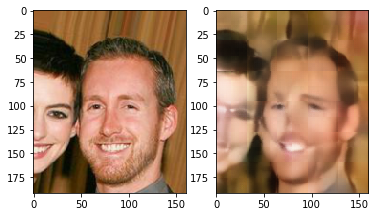

	Epoch 0 batch 2500 loss: 0.38761165738105774
	Epoch 0 batch 3000 loss: 0.3726915717124939
	Epoch 0 batch 3500 loss: 0.3602333068847656
	Epoch 0 batch 4000 loss: 0.36547955870628357


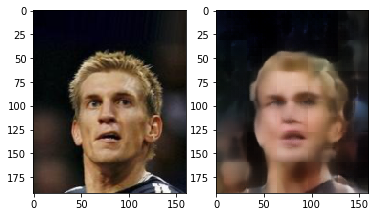

	Epoch 0 batch 4500 loss: 0.3729860782623291
	Epoch 0 batch 5000 loss: 0.3261168599128723


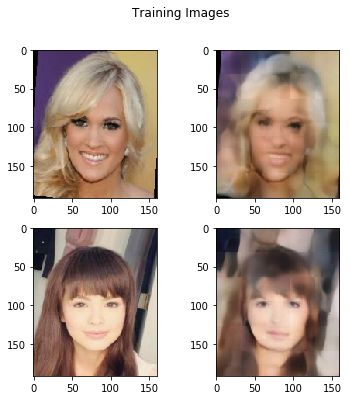

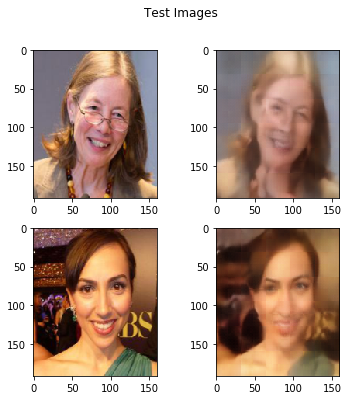

Epoch: 0 Train Loss: 2319.573708176613 Test Loss: 179.4450161755085
Copying file://gen_model_7_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

|
Operation completed over 1 objects/326.9 MiB.                                    


In [0]:
# re-train encoder and decoder FC layers for 1 epochs
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=500, plot_images=2000, num_epochs=1, display_images=1, scheduler=g_scheduler, save_path = "gen_model_7_var.pt")

	Epoch 1 batch 1000 loss: 0.20390090346336365
	Epoch 1 batch 2000 loss: 0.21232567727565765
	Epoch 1 batch 3000 loss: 0.20254729688167572


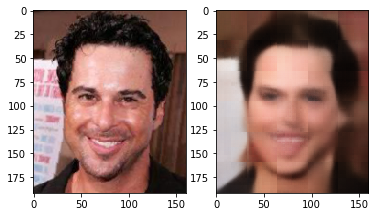

	Epoch 1 batch 4000 loss: 0.18992918729782104
	Epoch 1 batch 5000 loss: 0.19418394565582275


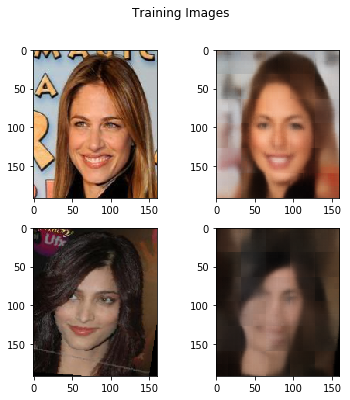

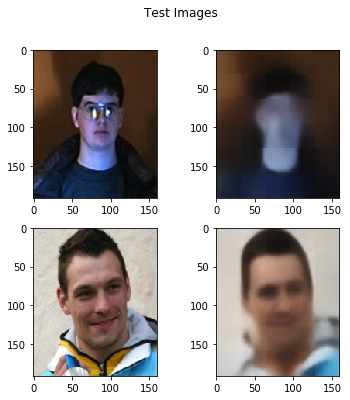

Epoch: 1 Train Loss: 992.6377397030592 Test Loss: 106.85753616690636
	Epoch 2 batch 1000 loss: 0.19922254979610443
	Epoch 2 batch 2000 loss: 0.18537014722824097
	Epoch 2 batch 3000 loss: 0.1889646202325821


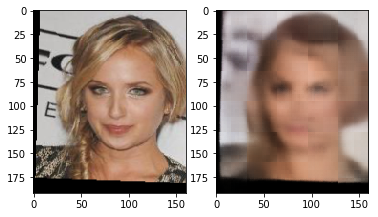

	Epoch 2 batch 4000 loss: 0.18537190556526184
	Epoch 2 batch 5000 loss: 0.20036235451698303


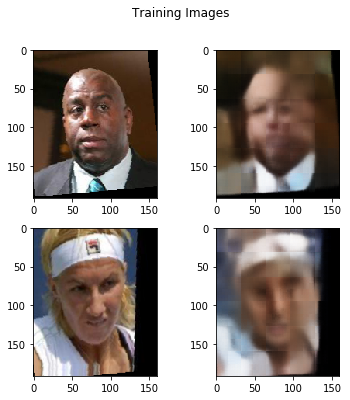

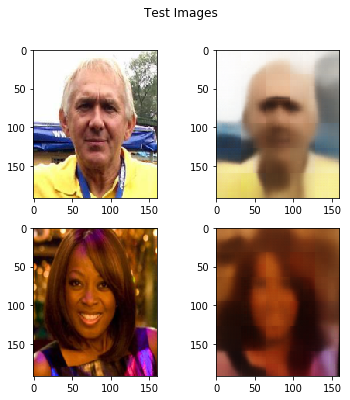

Epoch: 2 Train Loss: 940.9388407468796 Test Loss: 104.1103373169899
Copying file://gen_model_7_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

|
Operation completed over 1 objects/326.9 MiB.                                    


In [0]:
# continue training entire model
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=3000, num_epochs=2, display_images=1, scheduler=g_scheduler, save_path = "gen_model_7_var.pt")

	Epoch 1 batch 1000 loss: 0.13681766390800476
	Epoch 1 batch 2000 loss: 0.13800467550754547


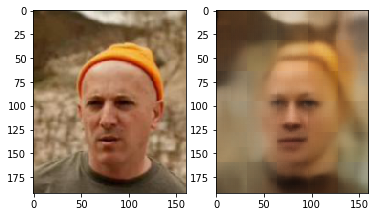

	Epoch 1 batch 3000 loss: 0.12931810319423676
	Epoch 1 batch 4000 loss: 0.1311820149421692


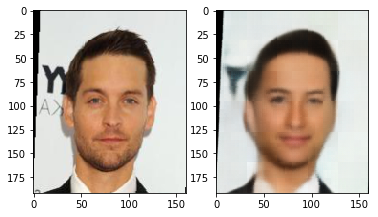

	Epoch 1 batch 5000 loss: 0.1238848865032196


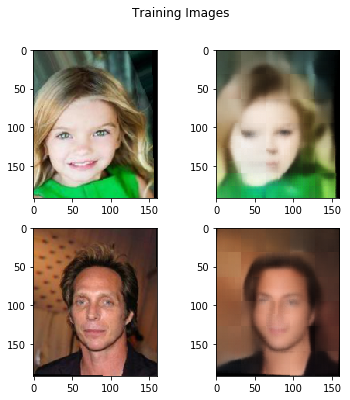

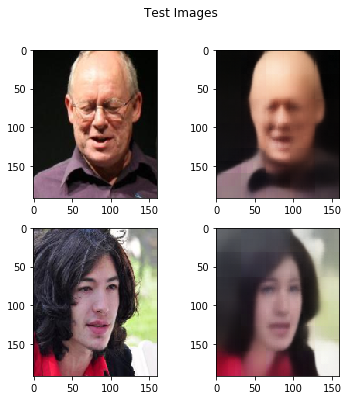

Epoch: 1 Train Loss: 672.3873427957296 Test Loss: 79.08400097489357
	Epoch 2 batch 1000 loss: 0.13503313064575195
	Epoch 2 batch 2000 loss: 0.12790334224700928


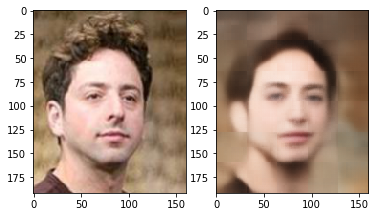

	Epoch 2 batch 3000 loss: 0.13225358724594116
	Epoch 2 batch 4000 loss: 0.13645297288894653


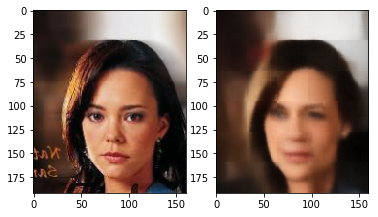

	Epoch 2 batch 5000 loss: 0.1190958023071289


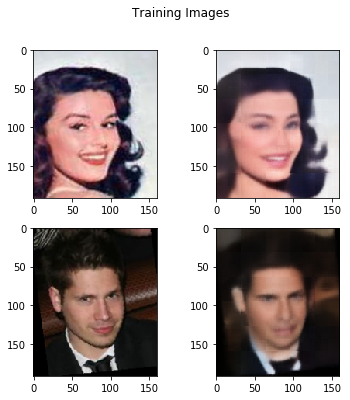

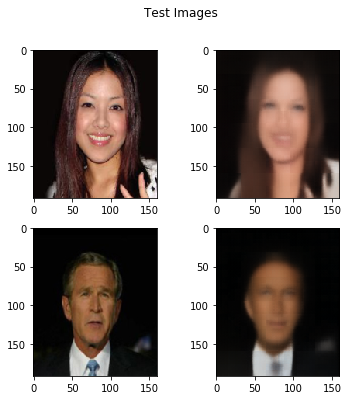

Epoch: 2 Train Loss: 663.7419888302684 Test Loss: 77.44854559749365
	Epoch 3 batch 1000 loss: 0.1389491856098175
	Epoch 3 batch 2000 loss: 0.1292884796857834


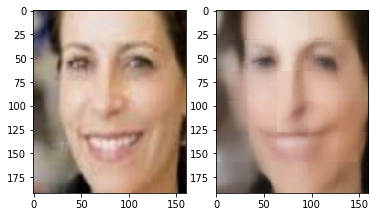

	Epoch 3 batch 3000 loss: 0.1373637616634369
	Epoch 3 batch 4000 loss: 0.12322649359703064


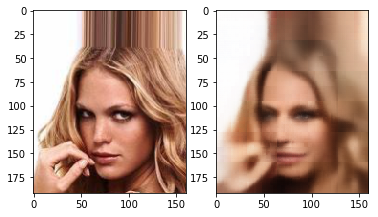

	Epoch 3 batch 5000 loss: 0.13234670460224152


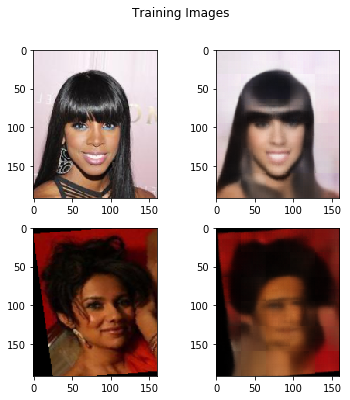

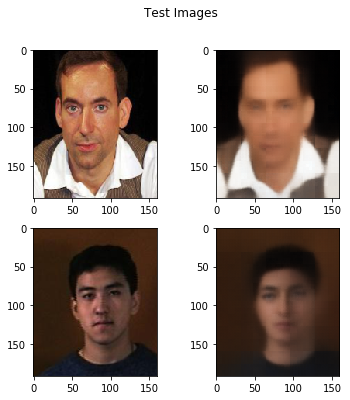

Epoch: 3 Train Loss: 657.3220278695226 Test Loss: 77.17837739735842
Copying file://gen_model_7_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

|
Operation completed over 1 objects/326.9 MiB.                                    


In [0]:
# re-train encoder and decoder FC layers for 1 epochs
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=2000, num_epochs=3, display_images=1, scheduler=g_scheduler, save_path = "gen_model_7_var.pt")

	Epoch 7 batch 1000 loss: 0.10048921406269073
	Epoch 7 batch 2000 loss: 0.10248681902885437
	Epoch 7 batch 3000 loss: 0.10174098610877991


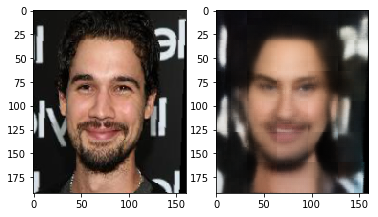

	Epoch 7 batch 4000 loss: 0.09900720417499542
	Epoch 7 batch 5000 loss: 0.08696961402893066


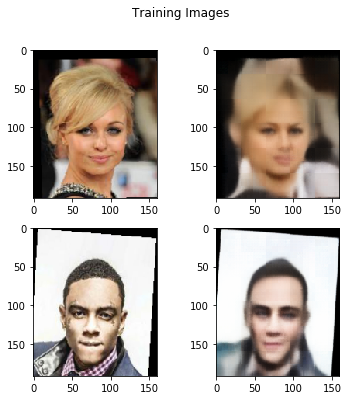

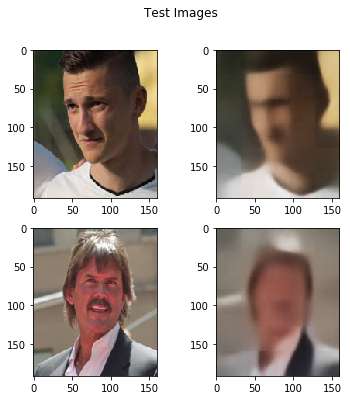

Epoch: 7 Train Loss: 490.7582230716944 Test Loss: 57.43765324354172
	Epoch 8 batch 1000 loss: 0.09232685714960098
	Epoch 8 batch 2000 loss: 0.10093621909618378
	Epoch 8 batch 3000 loss: 0.0967201441526413


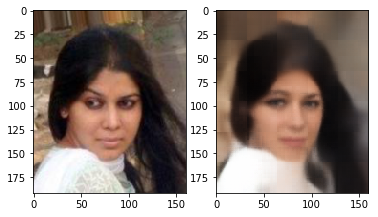

	Epoch 8 batch 4000 loss: 0.10263645648956299
	Epoch 8 batch 5000 loss: 0.09261201322078705


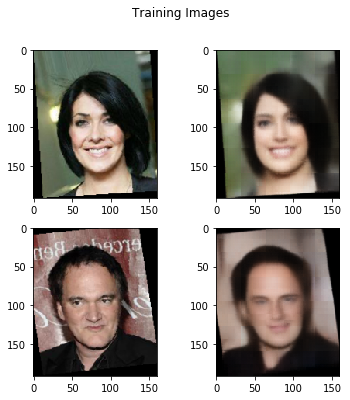

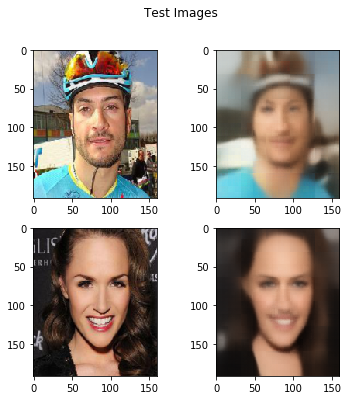

Epoch: 8 Train Loss: 489.9979283288121 Test Loss: 57.559286683797836
	Epoch 9 batch 1000 loss: 0.09683023393154144
	Epoch 9 batch 2000 loss: 0.09769721329212189
	Epoch 9 batch 3000 loss: 0.09602668881416321


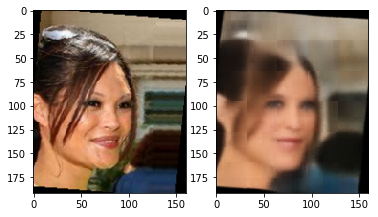

	Epoch 9 batch 4000 loss: 0.09395191818475723
	Epoch 9 batch 5000 loss: 0.08882321417331696


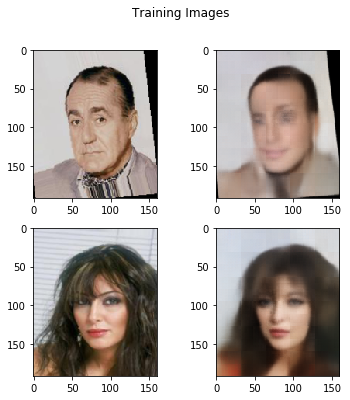

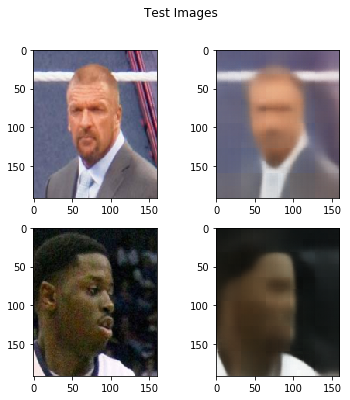

Epoch: 9 Train Loss: 488.008478730917 Test Loss: 57.82577408105135
Copying file://gen_model_7_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

\
Operation completed over 1 objects/326.9 MiB.                                    


In [0]:
# continue training entire model
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=3000, num_epochs=3, display_images=1, scheduler=g_scheduler, save_path = "gen_model_7_var.pt")

	Epoch 53 batch 1000 loss: 0.1152225062251091
	Epoch 53 batch 2000 loss: 0.12161426991224289
	Epoch 53 batch 3000 loss: 0.11723622679710388


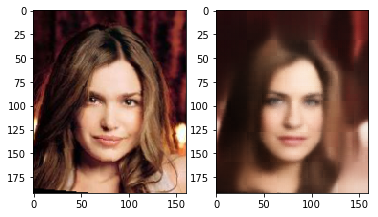

	Epoch 53 batch 4000 loss: 0.11547577381134033
	Epoch 53 batch 5000 loss: 0.11713263392448425
	Epoch 53 batch 6000 loss: 0.12253367900848389


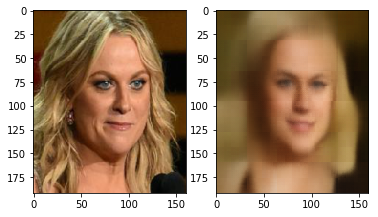

	Epoch 53 batch 7000 loss: 0.11970214545726776
	Epoch 53 batch 8000 loss: 0.1255176067352295


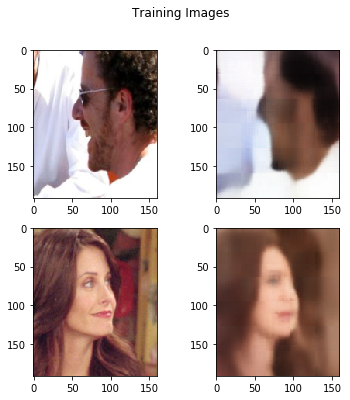

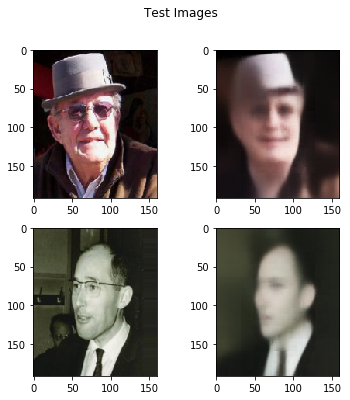

Epoch: 53 Train Loss: 1049.7790279835463 Test Loss: 65.96888969093561
	Epoch 54 batch 1000 loss: 0.12186703085899353
	Epoch 54 batch 2000 loss: 0.12778864800930023
	Epoch 54 batch 3000 loss: 0.12354476749897003


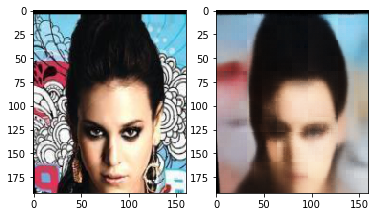

	Epoch 54 batch 4000 loss: 0.11552252620458603
	Epoch 54 batch 5000 loss: 0.11793066561222076
	Epoch 54 batch 6000 loss: 0.1300058513879776


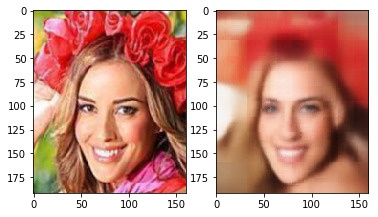

	Epoch 54 batch 7000 loss: 0.11323806643486023
	Epoch 54 batch 8000 loss: 0.11818839609622955


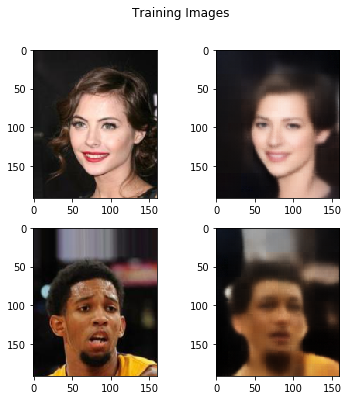

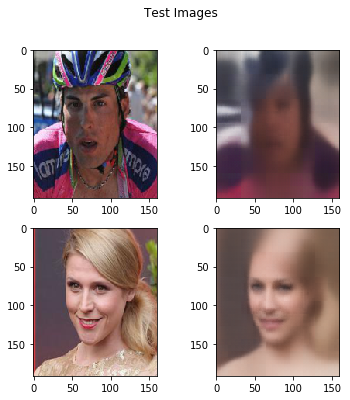

Epoch: 54 Train Loss: 1047.9812493398786 Test Loss: 65.62004554271698
	Epoch 55 batch 1000 loss: 0.11659111082553864
	Epoch 55 batch 2000 loss: 0.12043824791908264
	Epoch 55 batch 3000 loss: 0.11597099900245667


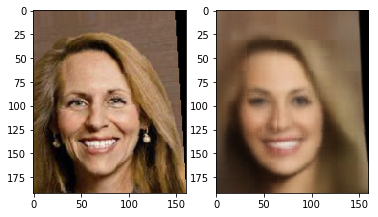

	Epoch 55 batch 4000 loss: 0.11643494665622711
	Epoch 55 batch 5000 loss: 0.11754006892442703
	Epoch 55 batch 6000 loss: 0.11684723943471909


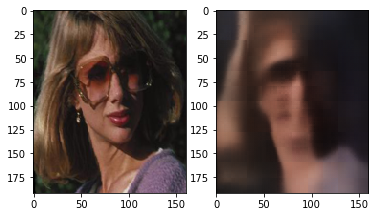

	Epoch 55 batch 7000 loss: 0.12449735403060913
	Epoch 55 batch 8000 loss: 0.12260477244853973


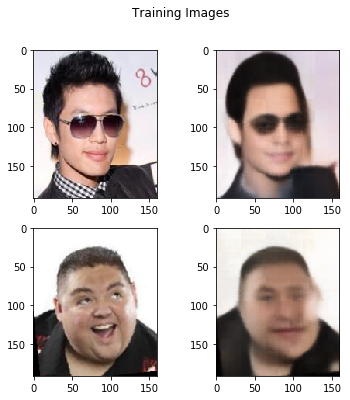

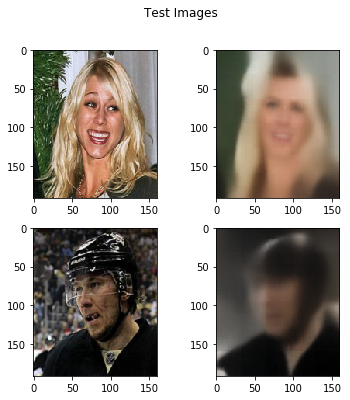

Epoch: 55 Train Loss: 1047.0995039641857 Test Loss: 65.99645076692104
Copying file://gen_model_7_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

|
Operation completed over 1 objects/326.9 MiB.                                    


In [0]:
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=3000, num_epochs=3, display_images=1, scheduler=g_scheduler, save_path = "gen_model_7_var.pt")

	Epoch 1 batch 1000 loss: 0.09933537244796753
	Epoch 1 batch 2000 loss: 0.10100745409727097
	Epoch 1 batch 3000 loss: 0.1138768121600151


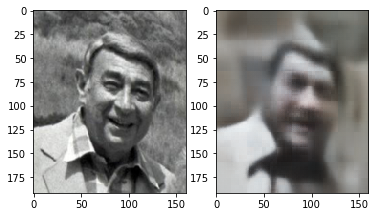

	Epoch 1 batch 4000 loss: 0.11376176029443741
	Epoch 1 batch 5000 loss: 0.0950789600610733
	Epoch 1 batch 6000 loss: 0.10801298916339874


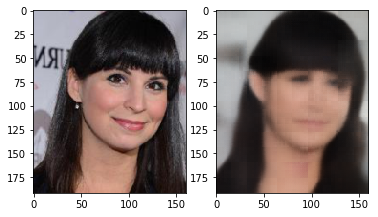

	Epoch 1 batch 7000 loss: 0.11280606687068939
	Epoch 1 batch 8000 loss: 0.1047695130109787


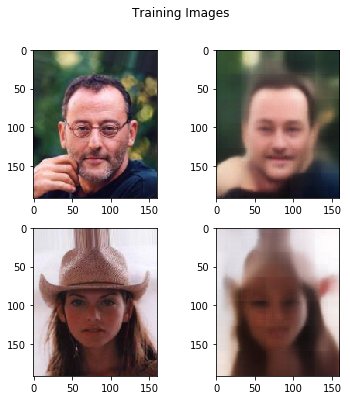

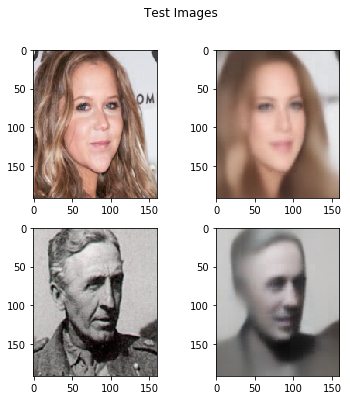

Epoch: 1 Train Loss: 933.2755350098014 Test Loss: 60.15725135803223
	Epoch 2 batch 1000 loss: 0.10537655651569366
	Epoch 2 batch 2000 loss: 0.10189122706651688
	Epoch 2 batch 3000 loss: 0.10613897442817688


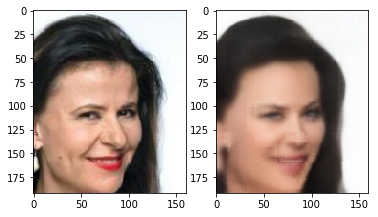

	Epoch 2 batch 4000 loss: 0.1064932718873024
	Epoch 2 batch 5000 loss: 0.09970584511756897
	Epoch 2 batch 6000 loss: 0.10853222012519836


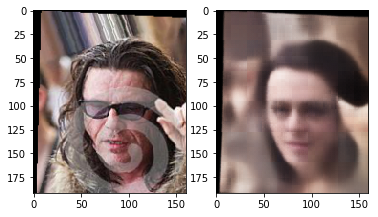

	Epoch 2 batch 7000 loss: 0.11379757523536682
	Epoch 2 batch 8000 loss: 0.10892851650714874


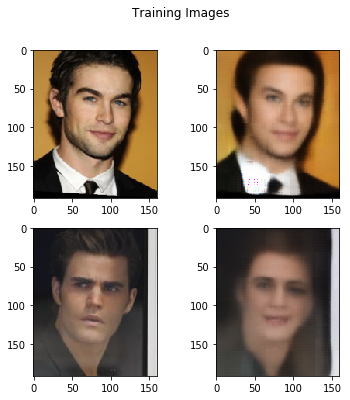

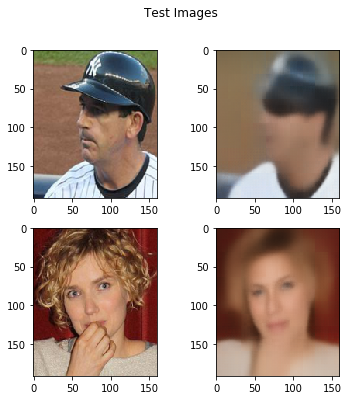

Epoch: 2 Train Loss: 932.0114729106426 Test Loss: 60.292072273790836
	Epoch 3 batch 1000 loss: 0.10922835767269135
	Epoch 3 batch 2000 loss: 0.10839594155550003
	Epoch 3 batch 3000 loss: 0.1087789535522461


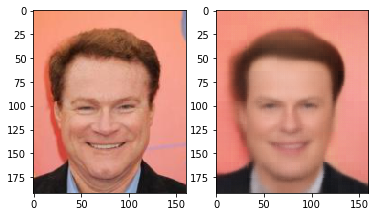

	Epoch 3 batch 4000 loss: 0.108871690928936
	Epoch 3 batch 5000 loss: 0.11291158199310303
	Epoch 3 batch 6000 loss: 0.09114603698253632


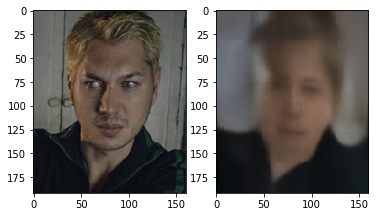

	Epoch 3 batch 7000 loss: 0.10424911975860596
	Epoch 3 batch 8000 loss: 0.1060417965054512


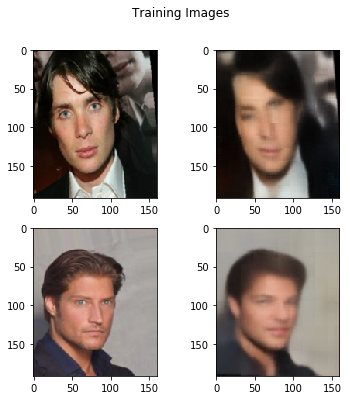

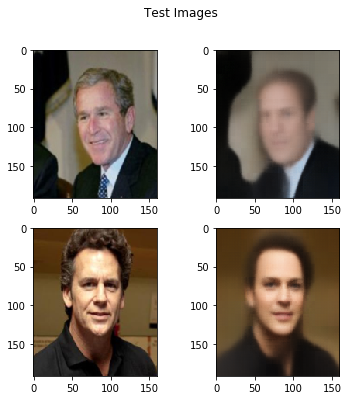

Epoch: 3 Train Loss: 931.480433948338 Test Loss: 59.908620193600655
Copying file://gen_model_7_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

\
Operation completed over 1 objects/326.9 MiB.                                    


In [18]:
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=3000, num_epochs=3, display_images=1, scheduler=g_scheduler, save_path = "gen_model_7_var.pt")

	Epoch 0 batch 1000 gen total loss: 0.9129139184951782 mse loss: 0.33160334825515747 kld loss: 0.12863406538963318 xe loss: 0.4526765048503876 disc loss: 0.36199915409088135 disc acc: 0.883300012588501
	Epoch 0 batch 2000 gen total loss: 0.9360586404800415 mse loss: 0.43241819739341736 kld loss: 0.14020514488220215 xe loss: 0.3634352684020996 disc loss: 0.2302020788192749 disc acc: 0.8828500129580498
	Epoch 0 batch 3000 gen total loss: 0.873605489730835 mse loss: 0.3420538306236267 kld loss: 0.13482758402824402 xe loss: 0.39672407507896423 disc loss: 0.36128249764442444 disc acc: 0.8815666802326838


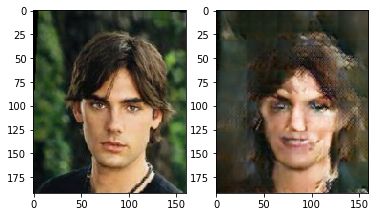

	Epoch 0 batch 4000 gen total loss: 0.9714944362640381 mse loss: 0.3609629273414612 kld loss: 0.13295936584472656 xe loss: 0.47757217288017273 disc loss: 0.30026331543922424 disc acc: 0.8813000137209892
	Epoch 0 batch 5000 gen total loss: 1.0302238464355469 mse loss: 0.46547451615333557 kld loss: 0.13810086250305176 xe loss: 0.42664843797683716 disc loss: 0.2376485913991928 disc acc: 0.8808600137233734
	Epoch 0 batch 6000 gen total loss: 0.8471508026123047 mse loss: 0.31463345885276794 kld loss: 0.13270671665668488 xe loss: 0.39981064200401306 disc loss: 0.39241543412208557 disc acc: 0.8804500139554342


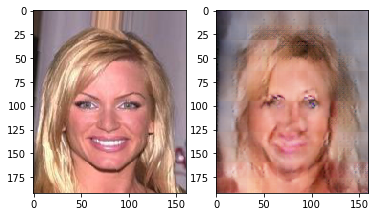

	Epoch 0 batch 7000 gen total loss: 0.8986454010009766 mse loss: 0.36781230568885803 kld loss: 0.13516709208488464 xe loss: 0.3956660330295563 disc loss: 0.27243974804878235 disc acc: 0.8807714426517487
	Epoch 0 batch 8000 gen total loss: 0.9391840100288391 mse loss: 0.3662987947463989 kld loss: 0.15297859907150269 xe loss: 0.4199065864086151 disc loss: 0.26754656434059143 disc acc: 0.8809250140041113
	Epoch 0 batch 9000 gen total loss: 0.8363009095191956 mse loss: 0.3015170097351074 kld loss: 0.12885527312755585 xe loss: 0.4059285819530487 disc loss: 0.21058838069438934 disc acc: 0.8799000140958362


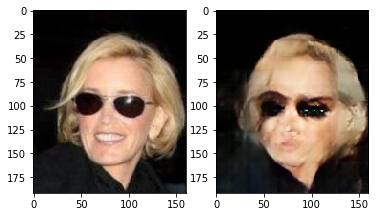

	Epoch 0 batch 10000 gen total loss: 0.9266733527183533 mse loss: 0.34603196382522583 kld loss: 0.12845094501972198 xe loss: 0.45219045877456665 disc loss: 0.35016947984695435 disc acc: 0.8804000140190125
	Epoch 0 batch 11000 gen total loss: 0.9663141369819641 mse loss: 0.39759203791618347 kld loss: 0.14614297449588776 xe loss: 0.4225791394710541 disc loss: 0.2824629247188568 disc acc: 0.8803909231966192
	Epoch 0 batch 12000 gen total loss: 0.8180891275405884 mse loss: 0.3533206284046173 kld loss: 0.14740882813930511 xe loss: 0.3173596262931824 disc loss: 0.2771056294441223 disc acc: 0.8805666806995869


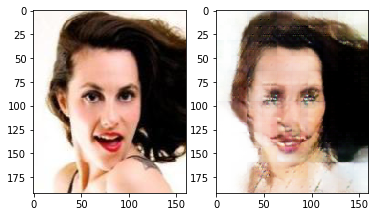

	Epoch 0 batch 13000 gen total loss: 0.8879916667938232 mse loss: 0.35801252722740173 kld loss: 0.1466597318649292 xe loss: 0.3833193778991699 disc loss: 0.3754449188709259 disc acc: 0.8811461679385258
	Epoch 0 batch 14000 gen total loss: 0.846076488494873 mse loss: 0.33963218331336975 kld loss: 0.12889693677425385 xe loss: 0.37754735350608826 disc loss: 0.16048550605773926 disc acc: 0.8815642997707639
	Epoch 0 batch 15000 gen total loss: 0.9751133322715759 mse loss: 0.397114098072052 kld loss: 0.14664025604724884 xe loss: 0.43135902285575867 disc loss: 0.21979904174804688 disc acc: 0.8822600141366322


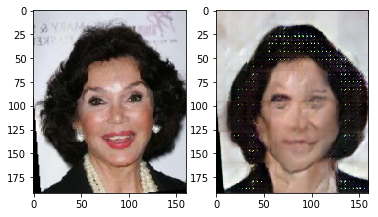

	Epoch 0 batch 16000 gen total loss: 0.9493640065193176 mse loss: 0.3828924596309662 kld loss: 0.14517873525619507 xe loss: 0.421292781829834 disc loss: 0.49288350343704224 disc acc: 0.8828125141263008
	Epoch 0 batch 17000 gen total loss: 0.8057833909988403 mse loss: 0.30327290296554565 kld loss: 0.12818124890327454 xe loss: 0.37432923913002014 disc loss: 0.32214975357055664 disc acc: 0.8826647200303919
	Epoch 0 batch 18000 gen total loss: 0.8249415159225464 mse loss: 0.3575514554977417 kld loss: 0.13873831927776337 xe loss: 0.3286517262458801 disc loss: 0.3695220947265625 disc acc: 0.8823500141302745


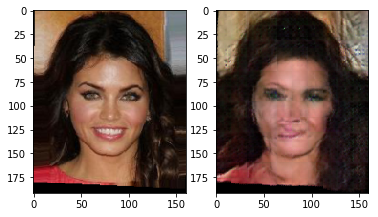

	Epoch 0 batch 19000 gen total loss: 0.9941574335098267 mse loss: 0.37967851758003235 kld loss: 0.1368672251701355 xe loss: 0.4776116907596588 disc loss: 0.3794809877872467 disc acc: 0.8821736983625512
	Epoch 0 batch 20000 gen total loss: 0.9105134010314941 mse loss: 0.35224685072898865 kld loss: 0.13350799679756165 xe loss: 0.42475858330726624 disc loss: 0.3438289761543274 disc acc: 0.8826100141406059
index 1 is out of bounds for dimension 0 with size 1


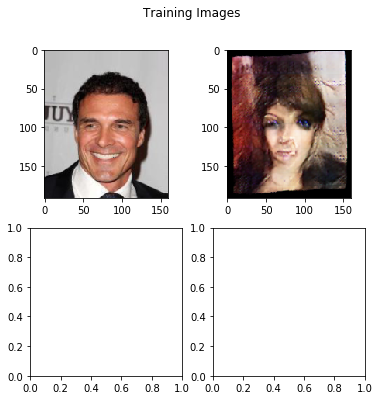

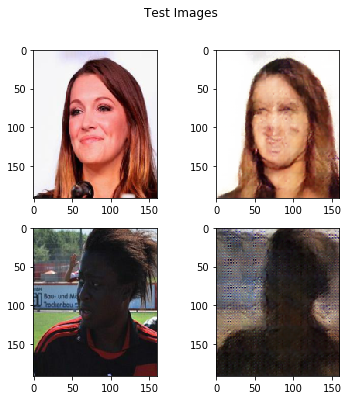

Epoch: 0 Gen Train Loss: 23148.183207333088 MSE Loss: 7417.491706252098 KLD Loss: 2805.359897457063 GAN XE Loss: 12925.331607431173 Disc Train Loss: 3160.7844600081444 Test Loss: 286.0575940310955 Avg Tr Disc Acc: 0.8825256754076156 Avg Te Disc Acc: 0.8632277129302495
	Epoch 1 batch 1000 gen total loss: 0.936964750289917 mse loss: 0.37099385261535645 kld loss: 0.14490197598934174 xe loss: 0.42106887698173523 disc loss: 0.22947421669960022 disc acc: 0.8939000126123429
	Epoch 1 batch 2000 gen total loss: 0.8482452630996704 mse loss: 0.3246656656265259 kld loss: 0.13705694675445557 xe loss: 0.3865226209163666 disc loss: 0.2140885889530182 disc acc: 0.8919500133991242
	Epoch 1 batch 3000 gen total loss: 0.991509199142456 mse loss: 0.3844631016254425 kld loss: 0.1483314037322998 xe loss: 0.45871469378471375 disc loss: 0.2147277146577835 disc acc: 0.8890333473682404


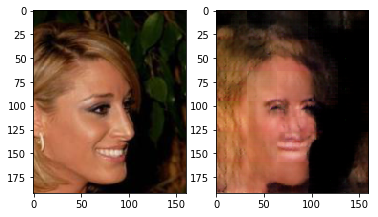

	Epoch 1 batch 4000 gen total loss: 0.8989973068237305 mse loss: 0.3828916549682617 kld loss: 0.1365501582622528 xe loss: 0.37955552339553833 disc loss: 0.24794793128967285 disc acc: 0.8891500140428543
	Epoch 1 batch 5000 gen total loss: 0.9011733531951904 mse loss: 0.36860162019729614 kld loss: 0.1424356997013092 xe loss: 0.39013609290122986 disc loss: 0.2979986369609833 disc acc: 0.8882800138711929
	Epoch 1 batch 6000 gen total loss: 0.8605024218559265 mse loss: 0.32322660088539124 kld loss: 0.12056773900985718 xe loss: 0.4167080521583557 disc loss: 0.41277679800987244 disc acc: 0.8880666804909706


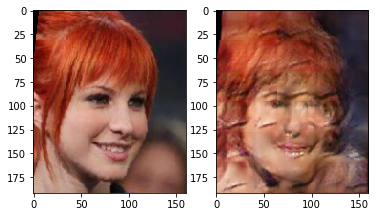

	Epoch 1 batch 7000 gen total loss: 0.9493891000747681 mse loss: 0.39441433548927307 kld loss: 0.14873802661895752 xe loss: 0.4062367379665375 disc loss: 0.3292374908924103 disc acc: 0.8895285849400929
	Epoch 1 batch 8000 gen total loss: 0.8039713501930237 mse loss: 0.3090525269508362 kld loss: 0.13053011894226074 xe loss: 0.36438870429992676 disc loss: 0.2651351988315582 disc acc: 0.8898000133335591
	Epoch 1 batch 9000 gen total loss: 0.9415901899337769 mse loss: 0.3359253704547882 kld loss: 0.12877216935157776 xe loss: 0.4768926799297333 disc loss: 0.3553270101547241 disc acc: 0.8898222355577681


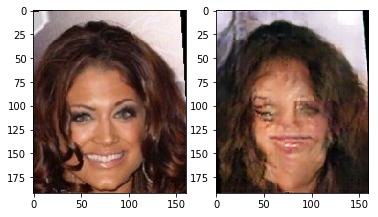

	Epoch 1 batch 10000 gen total loss: 0.8951975107192993 mse loss: 0.357650488615036 kld loss: 0.14421029388904572 xe loss: 0.3933367431163788 disc loss: 0.4002143442630768 disc acc: 0.8889200133681298
	Epoch 1 batch 11000 gen total loss: 0.9150770902633667 mse loss: 0.3548230528831482 kld loss: 0.14323818683624268 xe loss: 0.41701585054397583 disc loss: 0.23083190619945526 disc acc: 0.8887363770116459
	Epoch 1 batch 12000 gen total loss: 0.9882041215896606 mse loss: 0.3542609214782715 kld loss: 0.1347808986902237 xe loss: 0.49916234612464905 disc loss: 0.29407212138175964 disc acc: 0.8888250134189923


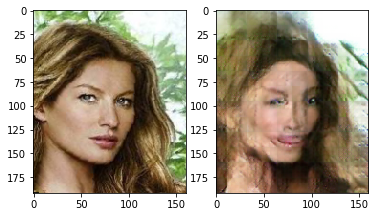

	Epoch 1 batch 13000 gen total loss: 0.9428105354309082 mse loss: 0.3955542743206024 kld loss: 0.1393394023180008 xe loss: 0.4079168736934662 disc loss: 0.25454720854759216 disc acc: 0.8889384749210798
	Epoch 1 batch 14000 gen total loss: 0.8344586491584778 mse loss: 0.315236359834671 kld loss: 0.13781952857971191 xe loss: 0.38140276074409485 disc loss: 0.4192465841770172 disc acc: 0.8891357277035713
	Epoch 1 batch 15000 gen total loss: 0.9310027956962585 mse loss: 0.3453020453453064 kld loss: 0.132675901055336 xe loss: 0.45302486419677734 disc loss: 0.2170492708683014 disc acc: 0.8892400133927664


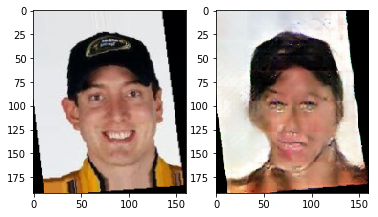

	Epoch 1 batch 16000 gen total loss: 0.8009934425354004 mse loss: 0.31383612751960754 kld loss: 0.14564290642738342 xe loss: 0.3415144085884094 disc loss: 0.5301620364189148 disc acc: 0.8893750134035945
	Epoch 1 batch 17000 gen total loss: 0.8269459009170532 mse loss: 0.3445498049259186 kld loss: 0.13623861968517303 xe loss: 0.3461574614048004 disc loss: 0.18472416698932648 disc acc: 0.8894764839200413
	Epoch 1 batch 18000 gen total loss: 0.9690347909927368 mse loss: 0.3732331693172455 kld loss: 0.13992318511009216 xe loss: 0.45587846636772156 disc loss: 0.21116052567958832 disc acc: 0.8901055688526895


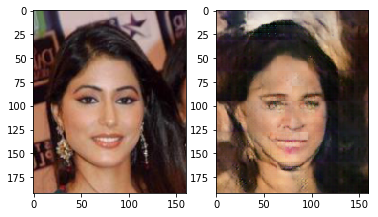

	Epoch 1 batch 19000 gen total loss: 0.9601315259933472 mse loss: 0.3496941328048706 kld loss: 0.1432720571756363 xe loss: 0.4671653211116791 disc loss: 0.2269880771636963 disc acc: 0.8901526449291329
	Epoch 1 batch 20000 gen total loss: 0.8430790305137634 mse loss: 0.34227484464645386 kld loss: 0.13766910135746002 xe loss: 0.36313509941101074 disc loss: 0.27819952368736267 disc acc: 0.8902850134015083


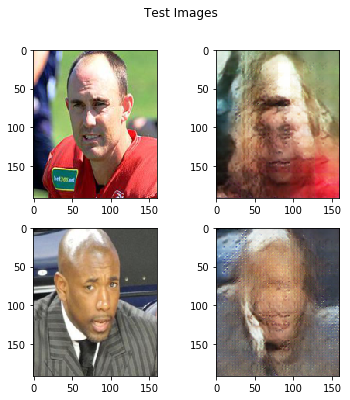

Epoch: 1 Gen Train Loss: 23304.986353337765 MSE Loss: 7382.977237075567 KLD Loss: 2821.745077930391 GAN XE Loss: 13100.26403066516 Disc Train Loss: 3053.1272831484675 Test Loss: 269.063259691 Avg Tr Disc Acc: 0.8901006845537495 Avg Te Disc Acc: 0.8007189123172942
Copying file://gen_model_7_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of com

In [11]:
train_discriminator(discriminator, generator, train_loader, d_optimizer, g_optimizer, num_epochs=2, print_metrics=1000, extra_gen_train=1, plot_images=3000, train_gen=True, train_disc=True, test_loader=test_loader, display_images=2000, g_scheduler=g_scheduler, d_scheduler=d_scheduler, d_save_path="disc_model_7_var.pt", g_save_path="gen_model_7_var.pt")

	Epoch 1 batch 1000 gen total loss: 1.482168436050415 mse loss: 0.444906622171402 kld loss: 0.19863300025463104 xe loss: 0.838628888130188 disc loss: 0.352026104927063 disc acc: 0.873500014424324
	Epoch 1 batch 2000 gen total loss: 1.529801845550537 mse loss: 0.36987897753715515 kld loss: 0.18550610542297363 xe loss: 0.9744167327880859 disc loss: 0.35128188133239746 disc acc: 0.8619500145316124
	Epoch 1 batch 3000 gen total loss: 1.6262211799621582 mse loss: 0.4222586154937744 kld loss: 0.18963420391082764 xe loss: 1.0143283605575562 disc loss: 0.3213258683681488 disc acc: 0.8666333478689193


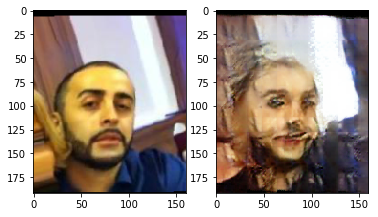

	Epoch 1 batch 4000 gen total loss: 1.4439889192581177 mse loss: 0.3630896806716919 kld loss: 0.20108571648597717 xe loss: 0.8798134922981262 disc loss: 0.3307574689388275 disc acc: 0.8674000146090984
	Epoch 1 batch 5000 gen total loss: 1.4602653980255127 mse loss: 0.38070598244667053 kld loss: 0.20567503571510315 xe loss: 0.873884379863739 disc loss: 0.21675081551074982 disc acc: 0.8699400144100189
	Epoch 1 batch 6000 gen total loss: 1.3443645238876343 mse loss: 0.4134626090526581 kld loss: 0.191993847489357 xe loss: 0.738908052444458 disc loss: 0.34101763367652893 disc acc: 0.8695000146826108


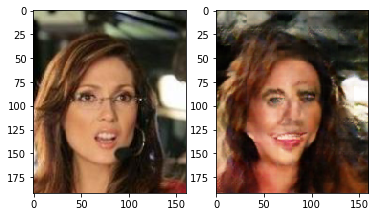

	Epoch 1 batch 7000 gen total loss: 1.546186089515686 mse loss: 0.4561331868171692 kld loss: 0.2079738825559616 xe loss: 0.8820790648460388 disc loss: 0.505683422088623 disc acc: 0.8710143002612251
	Epoch 1 batch 8000 gen total loss: 1.3912781476974487 mse loss: 0.4050518572330475 kld loss: 0.18687483668327332 xe loss: 0.7993513941764832 disc loss: 0.2816782593727112 disc acc: 0.871525014474988
	Epoch 1 batch 9000 gen total loss: 1.40724515914917 mse loss: 0.4281885623931885 kld loss: 0.18699073791503906 xe loss: 0.7920657992362976 disc loss: 0.2718691825866699 disc acc: 0.8722222368452284


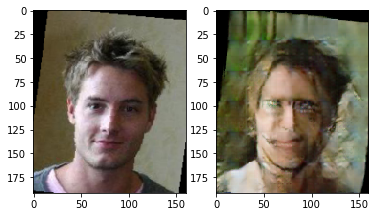

	Epoch 1 batch 10000 gen total loss: 1.6388460397720337 mse loss: 0.43235206604003906 kld loss: 0.1994773894548416 xe loss: 1.0070165395736694 disc loss: 0.33411940932273865 disc acc: 0.8725500146985053
	Epoch 1 batch 11000 gen total loss: 1.5459191799163818 mse loss: 0.3993528187274933 kld loss: 0.21287214756011963 xe loss: 0.9336941838264465 disc loss: 0.2801274359226227 disc acc: 0.8734272872643037
	Epoch 1 batch 12000 gen total loss: 1.3681844472885132 mse loss: 0.44908326864242554 kld loss: 0.19174298644065857 xe loss: 0.7273582220077515 disc loss: 0.24015331268310547 disc acc: 0.8740000145236652


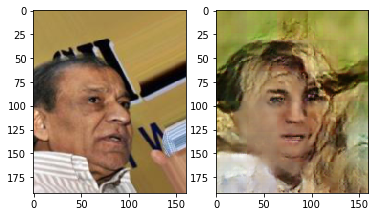

	Epoch 1 batch 13000 gen total loss: 1.3487815856933594 mse loss: 0.44055065512657166 kld loss: 0.19415605068206787 xe loss: 0.7140749096870422 disc loss: 0.3480069935321808 disc acc: 0.8743307838256542
	Epoch 1 batch 14000 gen total loss: 1.4021915197372437 mse loss: 0.44471123814582825 kld loss: 0.1950525939464569 xe loss: 0.7624276876449585 disc loss: 0.3705415427684784 disc acc: 0.8750928716489247
	Epoch 1 batch 15000 gen total loss: 1.370380163192749 mse loss: 0.43207114934921265 kld loss: 0.18756955862045288 xe loss: 0.7507395148277283 disc loss: 0.34507617354393005 disc acc: 0.8749400146802266


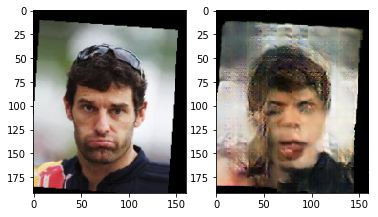

	Epoch 1 batch 16000 gen total loss: 1.5837217569351196 mse loss: 0.4692913591861725 kld loss: 0.19931483268737793 xe loss: 0.9151155352592468 disc loss: 0.17950741946697235 disc acc: 0.8749000147432089
	Epoch 1 batch 17000 gen total loss: 1.6138699054718018 mse loss: 0.44009900093078613 kld loss: 0.1921408772468567 xe loss: 0.9816301465034485 disc loss: 0.3191505968570709 disc acc: 0.8747529559275683
	Epoch 1 batch 18000 gen total loss: 1.3839550018310547 mse loss: 0.3777492642402649 kld loss: 0.19003205001354218 xe loss: 0.8161737322807312 disc loss: 0.3771752417087555 disc acc: 0.8745444592237472


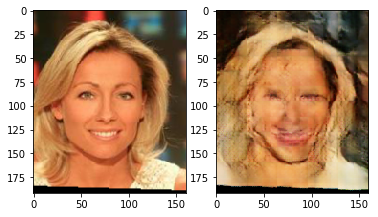

	Epoch 1 batch 19000 gen total loss: 1.3388928174972534 mse loss: 0.417467325925827 kld loss: 0.20282767713069916 xe loss: 0.7185977697372437 disc loss: 0.4436010420322418 disc acc: 0.8744579096216905
	Epoch 1 batch 20000 gen total loss: 1.3199394941329956 mse loss: 0.380508154630661 kld loss: 0.1772569864988327 xe loss: 0.7621744275093079 disc loss: 0.2626175582408905 disc acc: 0.8751750148117542


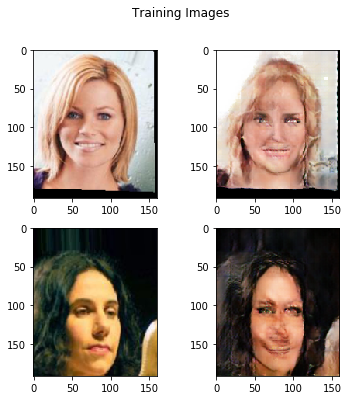

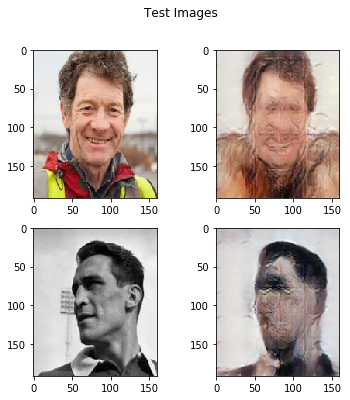

Epoch: 1 Gen Train Loss: 37455.18707180023 MSE Loss: 8722.874167531729 KLD Loss: 3970.3307967036963 GAN XE Loss: 24761.982157319784 Disc Train Loss: 3326.4985538572073 Test Loss: 326.166042804718 Avg Tr Disc Acc: 0.8752805780034663 Avg Te Disc Acc: 0.8304581403657929
	Epoch 2 batch 1000 gen total loss: 1.4946953058242798 mse loss: 0.446965754032135 kld loss: 0.20876924693584442 xe loss: 0.8389603495597839 disc loss: 0.42218151688575745 disc acc: 0.879300014257431
	Epoch 2 batch 2000 gen total loss: 1.4842815399169922 mse loss: 0.3913145363330841 kld loss: 0.18222959339618683 xe loss: 0.9107373356819153 disc loss: 0.32551321387290955 disc acc: 0.8772000145316124
	Epoch 2 batch 3000 gen total loss: 1.6889816522598267 mse loss: 0.4973668158054352 kld loss: 0.20751981437206268 xe loss: 0.9840950965881348 disc loss: 0.22258630394935608 disc acc: 0.8744333475033442


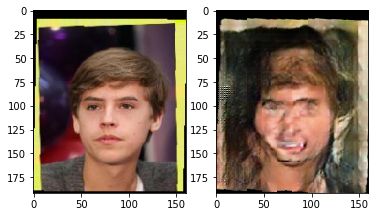

	Epoch 2 batch 4000 gen total loss: 1.5005431175231934 mse loss: 0.4916839003562927 kld loss: 0.21082492172718048 xe loss: 0.7980342507362366 disc loss: 0.3931856155395508 disc acc: 0.8750000140964985
	Epoch 2 batch 5000 gen total loss: 1.6033943891525269 mse loss: 0.5297071933746338 kld loss: 0.19368739426136017 xe loss: 0.8799997568130493 disc loss: 0.34827008843421936 disc acc: 0.8739600142478943
	Epoch 2 batch 6000 gen total loss: 1.4271440505981445 mse loss: 0.4580014944076538 kld loss: 0.2143600434064865 xe loss: 0.7547826170921326 disc loss: 0.26862195134162903 disc acc: 0.8733000143567721


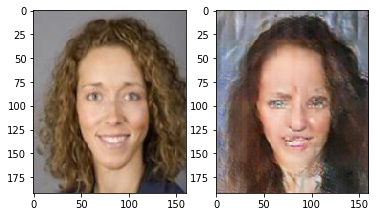

	Epoch 2 batch 7000 gen total loss: 1.342798113822937 mse loss: 0.481705904006958 kld loss: 0.19675199687480927 xe loss: 0.6643401980400085 disc loss: 0.3531293570995331 disc acc: 0.8739428716727665
	Epoch 2 batch 8000 gen total loss: 1.4595903158187866 mse loss: 0.45696526765823364 kld loss: 0.18935607373714447 xe loss: 0.8132689595222473 disc loss: 0.26590725779533386 disc acc: 0.8738375146985053
	Epoch 2 batch 9000 gen total loss: 1.3265459537506104 mse loss: 0.4177815616130829 kld loss: 0.18832366168498993 xe loss: 0.7204408049583435 disc loss: 0.20538893342018127 disc acc: 0.8747555703322093


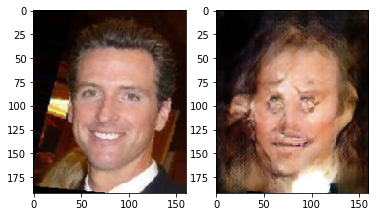

	Epoch 2 batch 10000 gen total loss: 1.5154820680618286 mse loss: 0.41071173548698425 kld loss: 0.1996733695268631 xe loss: 0.9050969481468201 disc loss: 0.24287040531635284 disc acc: 0.8744100148200988
	Epoch 2 batch 11000 gen total loss: 1.6406502723693848 mse loss: 0.4622572660446167 kld loss: 0.2023608535528183 xe loss: 0.9760321974754333 disc loss: 0.3575668931007385 disc acc: 0.8745818330374631
	Epoch 2 batch 12000 gen total loss: 1.668107509613037 mse loss: 0.4703339636325836 kld loss: 0.21666836738586426 xe loss: 0.9811051487922668 disc loss: 0.31154465675354004 disc acc: 0.8750083481272062


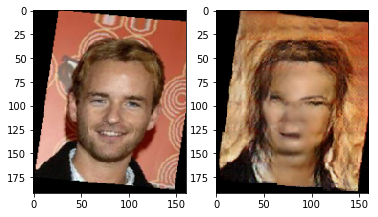

	Epoch 2 batch 13000 gen total loss: 1.6313360929489136 mse loss: 0.5160374641418457 kld loss: 0.21707001328468323 xe loss: 0.898228645324707 disc loss: 0.4642804265022278 disc acc: 0.8755000146902524
	Epoch 2 batch 14000 gen total loss: 1.6671277284622192 mse loss: 0.49404609203338623 kld loss: 0.2122155874967575 xe loss: 0.9608661532402039 disc loss: 0.19614045321941376 disc acc: 0.8756928718345506
	Epoch 2 batch 15000 gen total loss: 1.329980731010437 mse loss: 0.3501783609390259 kld loss: 0.17282788455486298 xe loss: 0.8069745302200317 disc loss: 0.3032447099685669 disc acc: 0.8758866813421249


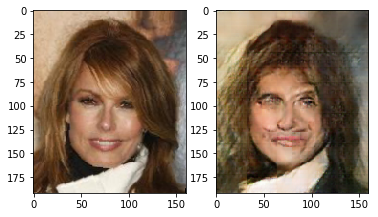

	Epoch 2 batch 16000 gen total loss: 1.432669997215271 mse loss: 0.4543556272983551 kld loss: 0.1865900307893753 xe loss: 0.7917243242263794 disc loss: 0.4801342487335205 disc acc: 0.8766562646701932
	Epoch 2 batch 17000 gen total loss: 1.638612151145935 mse loss: 0.4421149492263794 kld loss: 0.2224506139755249 xe loss: 0.974046528339386 disc loss: 0.28907403349876404 disc acc: 0.8770764851885683
	Epoch 2 batch 18000 gen total loss: 1.5201215744018555 mse loss: 0.4703249931335449 kld loss: 0.20121458172798157 xe loss: 0.8485820889472961 disc loss: 0.46132364869117737 disc acc: 0.8770500146581067


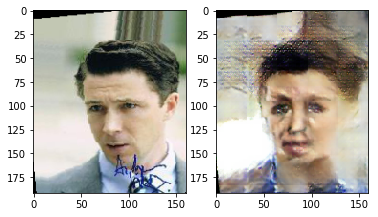

	Epoch 2 batch 19000 gen total loss: 1.393352746963501 mse loss: 0.43837353587150574 kld loss: 0.19284619390964508 xe loss: 0.7621330618858337 disc loss: 0.22778797149658203 disc acc: 0.8772631724727781
	Epoch 2 batch 20000 gen total loss: 1.4743778705596924 mse loss: 0.46866467595100403 kld loss: 0.2029191106557846 xe loss: 0.8027940988540649 disc loss: 0.3287365138530731 disc acc: 0.8772650146394968


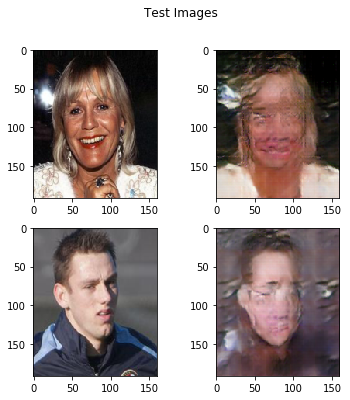

Epoch: 2 Gen Train Loss: 38081.926780581474 MSE Loss: 9217.261167556047 KLD Loss: 4005.391504317522 GAN XE Loss: 24859.274159669876 Disc Train Loss: 3298.9238366037607 Test Loss: 359.5695754289627 Avg Tr Disc Acc: 0.8774770240234129 Avg Te Disc Acc: 0.7810309625073537
Copying file://gen_model_7_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads o

In [10]:
train_discriminator(discriminator, generator, train_loader, d_optimizer, g_optimizer, num_epochs=2, print_metrics=1000, extra_gen_train=1, plot_images=3000, train_gen=True, train_disc=True, test_loader=test_loader, display_images=2000, g_scheduler=g_scheduler, d_scheduler=d_scheduler, d_save_path="disc_model_7_var.pt", g_save_path="gen_model_7_var.pt")

	Epoch 3 batch 1000 gen total loss: 1.312747597694397 mse loss: 0.44828492403030396 kld loss: 0.16834722459316254 xe loss: 0.6961154341697693 disc loss: 0.282602995634079 disc acc: 0.8725000152587891
	Epoch 3 batch 2000 gen total loss: 1.4287351369857788 mse loss: 0.49767374992370605 kld loss: 0.20038020610809326 xe loss: 0.7306812405586243 disc loss: 0.3329378068447113 disc acc: 0.881300013422966
	Epoch 3 batch 3000 gen total loss: 1.367517352104187 mse loss: 0.364910751581192 kld loss: 0.19099704921245575 xe loss: 0.8116095662117004 disc loss: 0.28761425614356995 disc acc: 0.8798666801452637
	Epoch 3 batch 4000 gen total loss: 1.426700234413147 mse loss: 0.41666674613952637 kld loss: 0.18675339221954346 xe loss: 0.8232801556587219 disc loss: 0.2795364260673523 disc acc: 0.8796250136792659


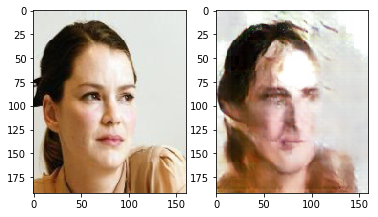

	Epoch 3 batch 5000 gen total loss: 1.3181309700012207 mse loss: 0.3741178512573242 kld loss: 0.20183637738227844 xe loss: 0.7421767115592957 disc loss: 0.2036559134721756 disc acc: 0.8788000138282775
	Epoch 3 batch 6000 gen total loss: 1.326426386833191 mse loss: 0.4623870849609375 kld loss: 0.19429723918437958 xe loss: 0.6697420477867126 disc loss: 0.4003056585788727 disc acc: 0.8781000142693519
	Epoch 3 batch 7000 gen total loss: 1.443897008895874 mse loss: 0.44854649901390076 kld loss: 0.19735680520534515 xe loss: 0.7979937195777893 disc loss: 0.3810358941555023 disc acc: 0.8789428715024675
	Epoch 3 batch 8000 gen total loss: 1.3125460147857666 mse loss: 0.4823153018951416 kld loss: 0.19533401727676392 xe loss: 0.6348967552185059 disc loss: 0.2983189523220062 disc acc: 0.8784000141024589


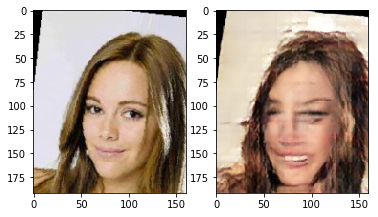

	Epoch 3 batch 9000 gen total loss: 1.6452075242996216 mse loss: 0.4857366681098938 kld loss: 0.20839248597621918 xe loss: 0.9510783553123474 disc loss: 0.40851911902427673 disc acc: 0.8768555699189504


In [0]:
# since we are training from scratch there is no reason to not train the discriminator now
train_discriminator(discriminator, generator, train_loader, d_optimizer, g_optimizer, num_epochs=2, print_metrics=1000, extra_gen_train=1, plot_images=4000, train_gen=True, train_disc=True, test_loader=test_loader, display_images=2000, g_scheduler=g_scheduler, d_scheduler=d_scheduler, d_save_path="disc_model_7_var.pt", g_save_path="gen_model_7_var.pt")

In [8]:
## CHECK MEAN AND VARIANCE OF CODES
with torch.no_grad():
    for (inputs, _) in test_loader:
        generator.encoder.eval()
        generator.decoder.eval()
        # encode the images and reconstruct them
        codes, logvar = generator.encoder(inputs.cuda())
        recon = generator.decoder(codes)
        vae_loss(inputs.cuda(), recon, codes, logvar=logvar, debug = True)
        print("Code Mean:", torch.mean(codes))
        print("Code Std:", codes.std())
        print("Logvar Mean:", torch.mean(logvar))
        print("Logvar Std:", logvar.std())
        break

MSE Loss Raw: tensor(0.0070, device='cuda:0')
MSE Loss Weighted: tensor(0.0723, device='cuda:0')
KLD Loss Raw: tensor(0.0553, device='cuda:0')
KLD Loss Weighted: tensor(0.0415, device='cuda:0')
Total Loss (weighted): tensor([0.1137])
Code Mean: tensor(-0.0004, device='cuda:0')
Code Std: tensor(0.2209, device='cuda:0')
Logvar Mean: tensor(-0.1078, device='cuda:0')
Logvar Std: tensor(0.5387, device='cuda:0')


### Interpolation

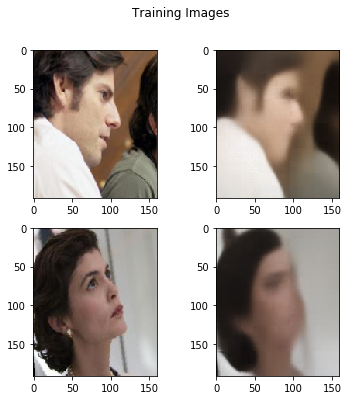

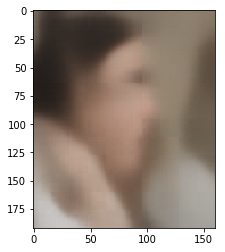

In [9]:
## TRY SOME INTERPOLATION
with torch.no_grad():
    for (inputs, _) in train_loader:
      generator.encoder.eval()
      generator.decoder.eval()
      # encode the images and reconstruct them
      codes, _ = generator.encoder(inputs.cuda())
      recon = generator.decoder(codes)

      # plot the images against their reconstructions
      fig, ax = plt.subplots(2, 2, figsize=(6,6))
      fig.suptitle("Training Images")
      ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
      ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
      ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
      ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
      plt.show()
      
      # interpolate the codes
      int_code = (codes[0] + codes[1]) / 2

      # decode the interpolation
      int_recon = generator.decoder(int_code.reshape(1, 4096, 1, 1))

      # plot the reconstruction
      plt.imshow(int_recon[0].cpu().permute(1, 2, 0))
      plt.show()
      break

In [9]:
!mkdir data/Train
!cp -r data/images/Training_Pictures data/Train/Images

mkdir: cannot create directory ‘data/Train’: File exists


In [0]:
transform2 = torchvision.transforms.Compose(
    [torchvision.transforms.Resize((192,160)),
      torchvision.transforms.ToTensor(),
    ])

train_dataset2 = torchvision.datasets.ImageFolder(
        root="data/Train",
        transform=transform
    )

train_loader2 = torch.utils.data.DataLoader(
    train_dataset2,
    batch_size=48,
    num_workers=2,
    shuffle=True
)

In [11]:
# since we are training from scratch there is no reason to not train the discriminator now
train_discriminator(discriminator, generator, train_loader2, d_optimizer, g_optimizer, num_epochs=1, print_metrics=1000, extra_gen_train=1, plot_images=3000, train_gen=True, train_disc=True, test_loader=test_loader, display_images=2000, g_scheduler=g_scheduler, d_scheduler=d_scheduler, d_save_path="disc_model_7_var.pt", g_save_path="gen_model_7_var.pt")

RuntimeError: ignored

In [0]:
with torch.no_grad():
    for (inputs, _) in train_loader2:
      for i, image in enumerate(inputs):
        plt.imshow(image.cpu().permute(1, 2, 0))
        plt.title(str(i))
        plt.show()
      break

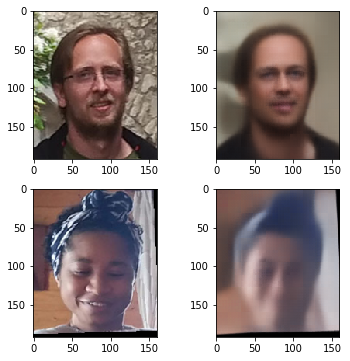

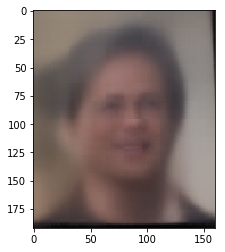

In [26]:
with torch.no_grad():
    for (inputs, _) in train_loader2:
      for i, image in enumerate(inputs):
        generator.encoder.eval()
        generator.decoder.eval()
        # encode the images and reconstruct them
        codes, _ = generator.encoder(inputs.cuda())
        recon = generator.decoder(codes)

        # plot the images against their reconstructions
        fig, ax = plt.subplots(2, 2, figsize=(6,6))
        ax[0,0].imshow(inputs[23].cpu().permute(1, 2, 0) )
        ax[0,1].imshow(recon[23].cpu().detach().permute(1, 2, 0) )
        ax[1,0].imshow(inputs[5].cpu().permute(1, 2, 0) )
        ax[1,1].imshow(recon[5].cpu().detach().permute(1, 2, 0) )
        plt.show()

        # interpolate the codes
        int_code = (codes[23] + codes[5]) / 2

          # decode the interpolation
        int_recon = generator.decoder(int_code.reshape(1, 4096, 1, 1))

        # plot the reconstruction
        plt.imshow(int_recon[0].cpu().permute(1, 2, 0))
        plt.show()
        break
      break

In [0]:
with torch.no_grad():
    for (inputs, _) in train_loader2:
      generator.encoder.eval()
      generator.decoder.eval()
      # encode the images and reconstruct them
      codes, _ = generator.encoder(inputs.cuda())
      recon = generator.decoder(codes)

      # plot the images against their reconstructions
      fig, ax = plt.subplots(2, 2, figsize=(6,6))
      ax[0,0].imshow(inputs[4].cpu().permute(1, 2, 0) )
      ax[0,1].imshow(recon[5].cpu().detach().permute(1, 2, 0) )
      ax[1,0].imshow(inputs[4].cpu().permute(1, 2, 0) )
      ax[1,1].imshow(recon[5].cpu().detach().permute(1, 2, 0) )
      plt.show()

      # interpolate the codes
      int_code = (codes[4] + codes[5]) / 2

        # decode the interpolation
      int_recon = generator.decoder(int_code.reshape(1, 4096, 1, 1))

      # plot the reconstruction
      plt.imshow(int_recon[0].cpu().permute(1, 2, 0))
      plt.show()
      break
     

In [0]:
with torch.no_grad():
    for (inputs, _) in train_loader2:
      for i, image in enumerate(inputs):
        generator.encoder.eval()
        generator.decoder.eval()
        # encode the images and reconstruct them
        codes, _ = generator.encoder(inputs.cuda())
        recon = generator.decoder(codes)

        # plot the images against their reconstructions
        fig, ax = plt.subplots(2, 2, figsize=(6,6))
        ax[0,0].imshow(inputs[18].cpu().permute(1, 2, 0) )
        ax[0,1].imshow(recon[18].cpu().detach().permute(1, 2, 0) )
        ax[1,0].imshow(inputs[19].cpu().permute(1, 2, 0) )
        ax[1,1].imshow(recon[19].cpu().detach().permute(1, 2, 0) )
        plt.show()

        # interpolate the codes
        int_code = (codes[18] + codes[19]) / 2

          # decode the interpolation
        int_recon = generator.decoder(int_code.reshape(1, 4096, 1, 1))

        # plot the reconstruction
        plt.imshow(int_recon[0].cpu().permute(1, 2, 0))
        plt.show()
        break
      break

In [0]:
train(generator, train_loader=train_loader2, optimizer=optimizer, print_metrics=10, plot_images=1, num_epochs=25, display_images=1, scheduler=scheduler)

In [0]:
train(model, train_loader=train_loader2, optimizer=optimizer, print_metrics=10, plot_images=1, num_epochs=30, display_images=1, scheduler=scheduler)

In [0]:
noise = np.random.normal(loc=0.3, scale=7.5, size=4096).reshape((1,4096,1,1))
image = model.decoder(torch.from_numpy(noise).cuda().float())
plt.imshow(image[0].cpu().detach().permute(1,2,0))
plt.show()